In [1]:
library(tidyverse)
library(nnet)
library(purrr)
library(furrr)
library(lme4)
library(ggplot2)
library(patchwork)
library(ggbeeswarm)


options(ggrepel.max.overlaps = Inf)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   0.3.4
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.2.1     ✔ stringr 1.4.1
✔ readr   2.1.2     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
Loading required package: future

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack




In [2]:
# xe_obj = qs::qread('230710_xenium_sct_unimapped_cca_polar_label.qs')
xe_obj_path = '_targets/objects/obj_rctd_merged_01'
xe_obj = qs::qread(xe_obj_path)
xe_obj@meta.data = xe_obj@meta.data %>%
mutate(predicted.polar_label = polar_label) %>%
filter(!is.na(predicted.polar_label))

xe_obj

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect




An object of class Seurat 
400 features across 28082 samples within 4 assays 
Active assay: Xenium (100 features, 99 variable features)
 3 layers present: scale.data, data, counts
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 2 dimensional reductions calculated: pca, umap
 15 spatial fields of view present: fov fov.2 fov.3 fov.4 fov.5 fov.6 fov.7 fov.8 fov.2.2 fov.3.2 fov.4.2 fov.5.2 fov.6.2 fov.7.2 fov.8.2

In [3]:
# mutate(polar_label = predicted.polar_label_2s) %>% #only for manual object
# mutate(predicted.polar_label = polar_label) %>% #only for manual object

In [4]:
xe_obj@assays$Xenium %>% Features

[1] "Sorcs1"   "Lingo2"   "Cntn4"    "Tenm2"    "Sox5"     "Ptprd"   
  [7] "Robo1"    "Plcl1"    "Oxr1"     "Plxdc2"   "Plp1"     "Kirrel3" 
 [13] "Mgat4c"   "Tenm3"    "Slit2"    "Nrg3"     "Hdac9"    "Col25a1" 
 [19] "Ncam2"    "Rbfox1"   "Fgf13"    "Pde10a"   "Deptor"   "Alcam"   
 [25] "Gria1"    "Grid2"    "Fam155a"  "Grm7"     "Agrp"     "Naaladl2"
 [31] "Ntm"      "Gpc5"     "Hs3st4"   "Lef1"     "Erbb4"    "Kctd16"  
 [37] "Zfhx3"    "Gtdc1"    "Pdgfra"   "Nrg1"     "Macrod2"  "Gpc6"    
 [43] "Pcdh11x"  "Kcnip4"   "Brinp3"   "Cadm2"    "Pde4b"    "Fhit"    
 [49] "Rgs6"     "Prkg1"    "Dlg2"     "Ptprk"    "Luzp2"    "Ptprt"   
 [55] "Nxph1"    "Kcnq3"    "Lrmda"    "Dcc"      "Cntn5"    "Adarb2"  
 [61] "Gabrg3"   "Rmst"     "Lrp1b"    "Trpm3"    "P3h2"     "Prr16"   
 [67] "Prkca"    "Nrxn3"    "Aqp4"     "Ctnna2"   "Inpp4b"   "Sgcz"    
 [73] "Fat3"     "Plcb1"    "Cacna2d3" "Bmp4"     "Tox"      "Car10"   
 [79] "Nkain2"   "Galntl6"  "Slc7a11"  "Pcdh9"    "Slc1a2"   "Pdzrn3"  
 [85] "Rax"      "Pomc"     "Zfp804b"  "Wwox"     "Pcdh7"    "Grm8"    
 [91] "Rtl4"     "Il1rapl2" "Sgcd"     "Egfem1"   "Arhgap6"  "Immp2l"  
 [97] "Cfap299"  "Htr3b"    "Csmd1"    "Lmx1a"

In [5]:
xe_obj %>% `[[` %>% pull(predicted.polar_label) %>% unique

[1] "Met__Prlh.none"           "Kiss1__Tac2.neg"         
 [3] "Lepr89.none"              "Lepr67.none"             
 [5] "Fez1.none"                "Esr1.none"               
 [7] "Reln__Lef1.none"          "Nfib_3.none"             
 [9] "Lpar1_oligo.none"         "Lepr15.none"             
[11] "Dlk1.none"                "Pomc__Ttr.none"          
[13] "Sst__Pthlh.pos"           "Ghrh.neg"                
[15] "Kiss1__Tac2.none"         "Npsr1__Epha3.none"       
[17] "Ppp1r17.none"             "Agrp.pos"                
[19] "Pomc__Anxa2.none"         "Nfix__Nfib.none"         
[21] "Sst__Pthlh.none"          "Gpr50__Tac2.none"        
[23] "Tmem215__Greb1.none"      "Agrp.none"               
[25] "Agrp.neg"                 "Ppp1r17__Ltbp1.none"     
[27] "Ghrh.pos"                 "Met__Pappa2.none"        
[29] "Pomc__Glipr1.none"        "Sst__Nts.none"           
[31] "Trh__Cxcl12.none"         "Nfix__Nfib__Hgf.none"    
[33] "Th__Slc6a3.none"          "Nfib_1.none"             
[35] "Ghrh.none"                "Pou6f2__Prkcq__Whrn.pos" 
[37] "Htr3b.pos"                "Tbx19__Pirt.pos"         
[39] "Ppp1r17__Tafa4.none"      "Th__Slc6a3.pos"          
[41] "Th__Nfib.none"            "Hdc.none"                
[43] "Pou6f2__Prkcq__Whrn.none" "Nfib_2.none"             
[45] "Sst__Unc13c.none"         "Nfix__Nfib__Lhx6.none"   
[47] "Arx__Nr5a2.none"          "Htr3b.neg"               
[49] "Tbx19__Pirt.none"         "Sim1.none"               
[51] "Slc17a6__Trhr.none"       "Sst__Unc13c.pos"         
[53] "Htr3b.none"               "Irx5__Lmx1a.none"        
[55] "Trh__Lef1.none"           "Tbx19__Pirt.neg"         
[57] "Tmem215__Dach2.none"      "OPC.neg"                 
[59] "Oligodendrocytes.none"    "Astrocytes.pos"          
[61] "Endothelial_cells.none"   "OPC.none"                
[63] "Astrocytes.neg"           "Astrocytes.none"         
[65] "b1_Tanycytes.none"        "OPC.pos"                 
[67] "Microglia.none"           "a1_Tanycytes.neg"        
[69] "Oligodendrocytes.pos"     "Oligodendrocytes.neg"    
[71] "Ependymal_cells.none"     "a1_Tanycytes.none"       
[73] "b2_Tanycytes.none"        "a2_Tanycytes.none"       
[75] "a2_Tanycytes.pos"

In [6]:
xe_obj %>%
`[[` %>%
rownames %>% length

[1] 28082

In [7]:
xe_obj@meta.data %>% colnames

[1] "orig.ident"               "nCount_Xenium"           
 [3] "nFeature_Xenium"          "nCount_BlankCodeword"    
 [5] "nFeature_BlankCodeword"   "nCount_ControlCodeword"  
 [7] "nFeature_ControlCodeword" "nCount_ControlProbe"     
 [9] "nFeature_ControlProbe"    "cell_area"               
[11] "density"                  "elongation"              
[13] "avg_confidence"           "nucleus_area"            
[15] "sample_name"              "treatment"               
[17] "strain"                   "time"                    
[19] "cell_class"               "seurat_clusters"         
[21] "labels"                   "labels_spot_class"       
[23] "polar_label"              "polar_label_spot_class"  
[25] "polarity"                 "predicted.polar_label"

In [8]:
meta = xe_obj@meta.data

In [9]:
summary_df = xe_obj %>% 
`[[` %>%
group_by(treatment, predicted.polar_label) %>%
summarise(n = n()) %>%
pivot_wider(names_from = treatment, values_from = n) %>%
mutate(predicted.label = predicted.polar_label %>% str_replace(fixed('.neg'), '') %>% str_replace(fixed('.none'), '') %>% str_replace(fixed('.pos'), '')) %>%
rowwise %>%
mutate(polarity = str_split(predicted.polar_label, fixed('.')) %>% unlist %>% `[[`(2)) %>%
ungroup %>%
group_by(predicted.label) %>%
mutate(FGF1_label_count = sum(FGF1)) %>%
mutate(VehPF_label_count = sum(Veh_PF)) %>%
mutate(label_diff = FGF1_label_count-VehPF_label_count) %>%
mutate(label_diff_frac = label_diff/VehPF_label_count) %>%
mutate(FGF1_minus_VehPF_polar = FGF1 - Veh_PF) %>%
relocate(FGF1_minus_VehPF_polar, .after='Veh_PF') %>%
ungroup %>%
mutate(sum_FGF1_all = sum(FGF1, na.rm = TRUE)) %>%
mutate(sum_VehPF_all = sum(Veh_PF, na.rm=TRUE)) %>%
mutate(FGF1_minus_VehPF_all = sum_FGF1_all - sum_VehPF_all) %>%
arrange(desc(abs(label_diff)))


summary_df

`summarise()` has grouped output by 'treatment'. You can override using the
`.groups` argument.


predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Oligodendrocytes.neg,63,84,-21,Oligodendrocytes,neg,1340,1531,-191,-0.12475506,13966,14116,-150
Oligodendrocytes.none,1213,1364,-151,Oligodendrocytes,none,1340,1531,-191,-0.12475506,13966,14116,-150
Oligodendrocytes.pos,64,83,-19,Oligodendrocytes,pos,1340,1531,-191,-0.12475506,13966,14116,-150
b2_Tanycytes.none,445,254,191,b2_Tanycytes,none,445,254,191,0.75196850,13966,14116,-150
Lepr15.none,802,985,-183,Lepr15,none,802,985,-183,-0.18578680,13966,14116,-150
Dlk1.none,244,339,-95,Dlk1,none,244,339,-95,-0.28023599,13966,14116,-150
Agrp.neg,243,383,-140,Agrp,neg,628,720,-92,-0.12777778,13966,14116,-150
Agrp.none,231,154,77,Agrp,none,628,720,-92,-0.12777778,13966,14116,-150
Agrp.pos,154,183,-29,Agrp,pos,628,720,-92,-0.12777778,13966,14116,-150


In [10]:
summary_df %>% filter(str_detect(predicted.polar_label,'Oligodendrocytes'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Oligodendrocytes.neg,63,84,-21,Oligodendrocytes,neg,1340,1531,-191,-0.1247551,13966,14116,-150
Oligodendrocytes.none,1213,1364,-151,Oligodendrocytes,none,1340,1531,-191,-0.1247551,13966,14116,-150
Oligodendrocytes.pos,64,83,-19,Oligodendrocytes,pos,1340,1531,-191,-0.1247551,13966,14116,-150


In [11]:
summary_df %>% filter(str_detect(predicted.polar_label,'OPC'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
OPC.neg,660,747,-87,OPC,neg,1194,1226,-32,-0.02610114,13966,14116,-150
OPC.none,323,395,-72,OPC,none,1194,1226,-32,-0.02610114,13966,14116,-150
OPC.pos,211,84,127,OPC,pos,1194,1226,-32,-0.02610114,13966,14116,-150


In [12]:
summary_df %>% filter(str_detect(predicted.polar_label,'Agrp'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Agrp.neg,243,383,-140,Agrp,neg,628,720,-92,-0.1277778,13966,14116,-150
Agrp.none,231,154,77,Agrp,none,628,720,-92,-0.1277778,13966,14116,-150
Agrp.pos,154,183,-29,Agrp,pos,628,720,-92,-0.1277778,13966,14116,-150


In [13]:
comparison_df = xe_obj %>% 
`[[` %>%
rownames_to_column(var = 'cell') %>%
dplyr::select(cell, sample_name, treatment, predicted.polar_label) %>%
rowwise %>%
mutate(label = predicted.polar_label %>% str_replace("\\.(pos|neg|none)$", ''),
       polarity = predicted.polar_label %>% str_split(fixed('.')) %>% unlist %>% last) %>%
mutate(treatment = factor(treatment, levels=c('Veh_PF', 'FGF1'))) %>%
mutate(polarity = factor(polarity, levels = c('none', 'pos', 'neg'))) %>% 
group_by(sample_name) %>%
mutate(sample_cell_count = n()) %>%
group_by(sample_name, label) %>%
mutate(sample_label_cell_count = n()) %>%
ungroup

comparison_df %>% print

# A tibble: 28,082 × 8
   cell               sample_name treatment predicted.polar_label label polarity
   <chr>              <chr>       <fct>     <chr>                 <chr> <fct>   
 1 Cell1003_6744_160… A1          Veh_PF    Met__Prlh.none        Met_… none    
 2 Cell10048_3107_93… A1          Veh_PF    Kiss1__Tac2.neg       Kiss… neg     
 3 Cell1004_3160_521… A1          Veh_PF    Lepr89.none           Lepr… none    
 4 Cell1005_2848_549… A1          Veh_PF    Lepr67.none           Lepr… none    
 5 Cell1006_3504_488… A1          Veh_PF    Fez1.none             Fez1  none    
 6 Cell10073_5015_54… A1          Veh_PF    Lepr67.none           Lepr… none    
 7 Cell10076_9751_99… A1          Veh_PF    Met__Prlh.none        Met_… none    
 8 Cell10086_3110_14… A1          Veh_PF    Esr1.none             Esr1  none    
 9 Cell1008_7822_530… A1          Veh_PF    Met__Prlh.none        Met_… none    
10 Cell1009_6749_164… A1          Veh_PF    Reln__Lef1.none       Reln… none    
# ℹ 2

In [14]:
comparison_df %>% group_by(label) %>% summarise(polarities = list(polarity %>% droplevels %>% levels))

label,polarities
<chr>,<list>
Agrp,"none, pos , neg"
Arx__Nr5a2,none
Astrocytes,"none, pos , neg"
Dlk1,none
Endothelial_cells,none
Ependymal_cells,none
Esr1,none
Fez1,none
Ghrh,"none, pos , neg"


In [15]:
df = comparison_df %>% filter(label == 'Oligodendrocytes') %>%
mutate(polarity = polarity %>% relevel(ref = 'none')) %>%
mutate(polarity =  polarity %>% droplevels)
df %>% print

# A tibble: 2,871 × 8
   cell               sample_name treatment predicted.polar_label label polarity
   <chr>              <chr>       <fct>     <chr>                 <chr> <fct>   
 1 Cell1001_7582_755… A1          Veh_PF    Oligodendrocytes.none Olig… none    
 2 Cell1007_6546_181… A1          Veh_PF    Oligodendrocytes.none Olig… none    
 3 Cell1025_4270_414… A1          Veh_PF    Oligodendrocytes.none Olig… none    
 4 Cell1026_7425_979… A1          Veh_PF    Oligodendrocytes.none Olig… none    
 5 Cell1029_7387_105… A1          Veh_PF    Oligodendrocytes.none Olig… none    
 6 Cell1071_3855_470… A1          Veh_PF    Oligodendrocytes.none Olig… none    
 7 Cell1076_8381_181… A1          Veh_PF    Oligodendrocytes.none Olig… none    
 8 Cell1085_2195_635… A1          Veh_PF    Oligodendrocytes.none Olig… none    
 9 Cell1094_5604_295… A1          Veh_PF    Oligodendrocytes.none Olig… none    
10 Cell1096_7401_114… A1          Veh_PF    Oligodendrocytes.none Olig… none    
# ℹ 2,

In [16]:
make_input_df = function(comparison_df_chunk, ref_level = 'none'){
    input_df = comparison_df_chunk %>%
        mutate(polarity = polarity %>% relevel(ref = ref_level)) %>%
        mutate(polarity =  polarity %>% droplevels)
    input_df
}

In [17]:
fit_multinom = function(input_df){
    # Fit the multinomial logistic regression model
    model <- multinom(polarity ~ treatment + sample_name, data = input_df)
#     model <- multinom(polarity ~ treatment, data = input_df)
    model
}

In [18]:
get_multinom_coef = function(model){
    coefs = summary(model)$coefficients
    coefs
}

get_multinom_zvalues = function(model){
    zvalues = summary(model)$coefficients / summary(model)$standard.errors
    zvalues
}

get_multinom_pvalues = function(zvalues){
    pvalues = 2 * (1 - pnorm(abs(zvalues)))
    pvalues
}



In [19]:
.get_results_long_to_wide_df = function(results, polarity_name, value.type){
    results_df = results %>% as.data.frame %>%
    set_names(polarity_name) %>%
#     set_names(input_df %>% pull(polarity) %>% levels %>% last) %>% 
    t %>% as.data.frame %>%
    mutate(value_type = value.type) %>%
    rownames_to_column %>%
    relocate(value_type, .after='polarity')
    results_df
}

In [20]:
.get_results_already_wide_df = function(results, value.type){
    results_df = results %>% 
    as.data.frame %>%
    rownames_to_column(var = 'polarity') %>%
    mutate(value_type = value.type) %>%
    relocate(value_type, .after='polarity')
    results_df
}

In [21]:
make_multinom_results_df = function(df){
    input_df = make_input_df(df)
    model = fit_multinom(input_df)
    zvalues = model %>% get_multinom_zvalues
    pvalues = zvalues %>% get_multinom_pvalues
    coefs = model %>% get_multinom_coef
    polarity_levels = input_df %>% pull(polarity) %>% levels
    if (length(polarity_levels) > 2){
        zvalues_df = .get_results_already_wide_df(zvalues, 'zvalue')
        pvalues_df = .get_results_already_wide_df(pvalues, 'pvalue')
        coefs_df = .get_results_already_wide_df(coefs, 'coef')
    } else {
        polarity_name = polarity_levels %>% last
        zvalues_df = .get_results_long_to_wide_df(zvalues, polarity_name, 'zvalue')
        pvalues_df = .get_results_long_to_wide_df(pvalues, polarity_name, 'pvalue')
        coefs_df = .get_results_long_to_wide_df(coefs, polarity_name, 'pvalue')
    }
    results_df = rbind(pvalues_df, zvalues_df, coefs_df) %>%
    mutate(label = input_df %>% distinct(label) %>% pull) %>%
    relocate(label)
    results_df
}

In [22]:
make_multinom_results_df_safe = function(df){
    results_df = tryCatch(
        make_multinom_results_df(df),
        error = function(e) data.frame()
    )
    results_df
}

In [23]:
#no idea why I removed this
# comparison_df_f = comparison_df %>%
# filter(!(sample_name == 'D2' & label == 'Agrp'))

# entire comparison_df
comparison_df_f = comparison_df 

In [24]:
#no idea why I removed this
# comparison_df_f = comparison_df %>%
# filter(!(sample_name == 'C2' & label == 'Rgs16_Dlx1'))
comparison_df_f = comparison_df 
# entire comparison_df


In [25]:
# Group the dataframe by label and fit glmer model in parallel
results_df_list <- comparison_df_f %>%
  group_split(label) %>%
  map(function(subset) {
      result_list = subset %>% make_multinom_results_df_safe
      result_list
  })

results_df = results_df_list %>% bind_rows


# weights:  30 (18 variable)
initial  value 1480.929365 
iter  10 value 1398.658239
iter  20 value 1396.601903
final  value 1396.600989 
converged
# weights:  30 (18 variable)
initial  value 4597.692428 
iter  10 value 3940.179236
iter  20 value 3890.579237
final  value 3890.130671 
converged
# weights:  30 (18 variable)
initial  value 295.526706 
iter  10 value 231.048650
iter  20 value 230.102701
iter  30 value 230.089576
final  value 230.089563 
converged
# weights:  30 (18 variable)
initial  value 269.160011 
iter  10 value 193.081567
final  value 193.055991 
converged
# weights:  10 (9 variable)
initial  value 142.788319 
iter  10 value 133.033513
final  value 133.032736 
converged
# weights:  30 (18 variable)
initial  value 2658.641739 
iter  10 value 2244.266964
iter  20 value 2211.685821
final  value 2210.769668 
converged
# weights:  30 (18 variable)
initial  value 3154.115881 
iter  10 value 1673.707124
iter  20 value 1177.087226
iter  30 value 1136.942543
final  value 1136.9

In [26]:
results_df %>% head # all Agrp

,label,polarity,value_type,(Intercept),treatmentFGF1,sample_nameA2,sample_nameB1,sample_nameB2,sample_nameC1,sample_nameC2,sample_nameD1,sample_nameD2
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Agrp,pos,pvalue,7.963326e-02,6.407580e-04,0.5744779,0.40516594,0.2331337,0.32520086,0.2245361,0.648462418,0.01748888
2,Agrp,neg,pvalue,1.294240e-10,5.145161e-08,0.0181369,0.86504709,0.0392129,0.70902280,0.5208574,0.002397483,0.02593428
3,Agrp,pos,zvalue,1.752818e+00,-3.413748e+00,-0.5614690,-0.83243059,-1.1923254,0.98382643,-1.2145544,-0.455899266,-2.37626537
4,Agrp,neg,zvalue,6.427847e+00,-5.446220e+00,-2.3628113,-0.16995302,-2.0619457,0.37316882,-0.6420243,-3.035988764,-2.22719441
5,Agrp,pos,coef,3.697474e-01,-6.479660e-01,-0.1773750,-0.26153435,-0.3491277,0.17912748,-0.2641007,-0.076603103,-0.48638972
6,Agrp,neg,coef,1.190728e+00,-9.040324e-01,-0.6799014,-0.04559625,-0.5293293,0.06050036,-0.1160667,-0.471618055,-0.37684801


In [27]:
polarity_sig_df = results_df %>% 
select(label, polarity, treatmentFGF1, value_type) %>% distinct %>%
# group_by(label, polarity) %>%
pivot_wider(names_from = 'value_type', values_from = 'treatmentFGF1') %>%
rename(pval = pvalue, z = zvalue) %>%
ungroup %>%
mutate(pval_corrected = p.adjust(pval, method = "BH")) %>%
arrange(label) %>% 
mutate(significant = case_when(pval < 0.05 ~ '**',
                                TRUE ~ '')) %>%
mutate(significant_adj = case_when(pval_corrected < 0.05 ~ '**',
                               TRUE ~ '')) %>%
relocate(pval, coef, z, significant, significant_adj, .after='polarity') %>%
mutate(z = case_when(abs(z) > 8 ~ sign(z)*8,
                     TRUE ~ z))

polarity_sig_df

label,polarity,pval,coef,z,significant,significant_adj,pval_corrected
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
Agrp,pos,6.407580e-04,-0.64796602,-3.4137481,**,**,2.242653e-03
Agrp,neg,5.145161e-08,-0.90403244,-5.4462196,**,**,3.601613e-07
Astrocytes,pos,6.081354e-01,0.06543834,0.5127369,,,6.207551e-01
Astrocytes,neg,4.138204e-01,-0.10633110,-0.8171890,,,6.207551e-01
Ghrh,pos,6.207551e-01,-0.26819094,-0.4947805,,,6.207551e-01
Ghrh,neg,6.050439e-02,-0.68158575,-1.8771000,,,1.694123e-01
Htr3b,pos,3.580835e-01,0.48385598,0.9190231,,,6.207551e-01
Htr3b,neg,5.240554e-01,-0.39976979,-0.6371066,,,6.207551e-01
OPC,pos,7.449326e-07,1.07090211,4.9492676,**,**,3.476352e-06


In [28]:
get_glmer_pvalue = function(model){
    model_summary = summary(model)
    pvalue = model_summary %>% 
        `[[`('coefficients') %>%
        as.data.frame %>%
        dplyr::select(any_of('Pr(>|z|)')) %>%
        rownames_to_column %>%
        filter(rowname == 'treatmentFGF1') %>%
        pull('Pr(>|z|)')
    pvalue
}

get_glmer_coef = function(model){
    model_summary = summary(model)
    coef = model_summary %>% 
        `[[`('coefficients') %>%
        as.data.frame %>%
        dplyr::select(any_of('Estimate')) %>%
        rownames_to_column %>%
        filter(rowname == 'treatmentFGF1') %>%
        pull('Estimate')
    coef
}

In [29]:
make_result = function(subset){
    result_name = subset %>% distinct(label) %>% pull
    model = tryCatch(
      glmer(polarity ~ treatment + (1 | sample_name), data = subset, family = binomial),
      error = function(e) NA
    )
    pval = tryCatch(
               get_glmer_pvalue(model),
               error = function(e) 1
           )
    coef = tryCatch(
           get_glmer_coef(model),
           error = function(e) NA
       )
    result_list = list(name = result_name,
                       pval = pval,
                       coef = coef,
                       model = model)
    result_list
}

In [30]:


# Group the dataframe by label and fit glmer model in parallel
models <- comparison_df %>%
  group_split(label) %>%
  map(function(subset) {
      result_list = subset %>% make_result
      result_list
  })


boundary (singular) fit: see help('isSingular')

boundary (singular) fit: see help('isSingular')

boundary (singular) fit: see help('isSingular')



In [31]:


# Combine models into a tibble
result <- map_dfr(models, ~ tibble(label = .x$name, pval = .x$pval, coef = .x$coef))

# Print the result
result %>% arrange(pval)


label,pval,coef
<chr>,<dbl>,<dbl>
Agrp,3.622872e-07,-0.756583189
OPC,6.435633e-02,0.250117295
a2_Tanycytes,6.878114e-02,0.964618741
Tbx19__Pirt,8.114692e-02,-0.892193171
Th__Slc6a3,1.981090e-01,0.475669308
Oligodendrocytes,3.278966e-01,-0.155930997
Ghrh,4.103809e-01,-0.301674695
Kiss1__Tac2,4.401594e-01,0.250792881
Sst__Pthlh,8.358514e-01,0.075115671


In [32]:
make_glmer_result_ncells = function(comparison_df, current_ct){
    comparison_df_1vr = comparison_df %>%
        mutate(test_label = case_when(label == current_ct ~ current_ct,
                                      TRUE ~ 'other')) %>%
        mutate(test_label = factor(test_label, levels=c('other', current_ct)))
    print(dim(comparison_df_1vr))
    model = tryCatch(
      glmer(test_label ~ treatment + (1 | sample_name), data = comparison_df_1vr, family = binomial),
      error = function(e) NA
    )
    pval = tryCatch(
               get_glmer_pvalue(model),
               error = function(e) 1
           )
    coef = tryCatch(
           get_glmer_coef(model),
           error = function(e) NA
       )
    result_list = list(name = current_ct,
                       pval = pval,
                       coef = coef,
                       model = model)
    result_list
}

In [33]:
make_glmer_result_ncells = function(comparison_df, current_ct){
    comparison_df_1vr = comparison_df %>%
        mutate(test_label = case_when(label == current_ct ~ current_ct,
                                      TRUE ~ 'other')) %>%
        mutate(test_label = factor(test_label, levels=c('other', current_ct)))
    print(dim(comparison_df_1vr))
    model = tryCatch(
      glmer(test_label ~ treatment + (1 | sample_name), data = comparison_df_1vr, family = binomial),
      error = function(e) NA
    )
    pval = tryCatch(
               get_glmer_pvalue(model),
               error = function(e) 1
           )
    coef = tryCatch(
           get_glmer_coef(model),
           error = function(e) NA
       )
    zscores = tryCatch(
           summary(model)$coefficients[,"z value"][[2]],
           error = function(e) NA
       )
    result_list = list(name = current_ct,
                       pval = pval,
                       coef = coef,
                       zscores = zscores,
                       model = model)
    result_list
}


In [34]:
comparison_df %>% head

cell,sample_name,treatment,predicted.polar_label,label,polarity,sample_cell_count,sample_label_cell_count
<chr>,<chr>,<fct>,<chr>,<chr>,<fct>,<int>,<int>
Cell1003_6744_1600_1,A1,Veh_PF,Met__Prlh.none,Met__Prlh,none,4059,393
Cell10048_3107_9376_1,A1,Veh_PF,Kiss1__Tac2.neg,Kiss1__Tac2,neg,4059,21
Cell1004_3160_5211_1,A1,Veh_PF,Lepr89.none,Lepr89,none,4059,106
Cell1005_2848_5498_1,A1,Veh_PF,Lepr67.none,Lepr67,none,4059,22
Cell1006_3504_4888_1,A1,Veh_PF,Fez1.none,Fez1,none,4059,77
Cell10073_5015_5488_1,A1,Veh_PF,Lepr67.none,Lepr67,none,4059,22


In [35]:
labels <- unique(comparison_df$label)

# Group the dataframe by label and fit glmer model in parallel
models = map(labels, function(current_ct) {
  results_list = make_glmer_result_ncells(comparison_df, current_ct)
  results_list
})

[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9
[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9
[1] 28082     9
[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9
[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9


boundary (singular) fit: see help('isSingular')



[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9
[1] 28082     9


In [36]:
comparison_df

cell,sample_name,treatment,predicted.polar_label,label,polarity,sample_cell_count,sample_label_cell_count
<chr>,<chr>,<fct>,<chr>,<chr>,<fct>,<int>,<int>
Cell1003_6744_1600_1,A1,Veh_PF,Met__Prlh.none,Met__Prlh,none,4059,393
Cell10048_3107_9376_1,A1,Veh_PF,Kiss1__Tac2.neg,Kiss1__Tac2,neg,4059,21
Cell1004_3160_5211_1,A1,Veh_PF,Lepr89.none,Lepr89,none,4059,106
Cell1005_2848_5498_1,A1,Veh_PF,Lepr67.none,Lepr67,none,4059,22
Cell1006_3504_4888_1,A1,Veh_PF,Fez1.none,Fez1,none,4059,77
Cell10073_5015_5488_1,A1,Veh_PF,Lepr67.none,Lepr67,none,4059,22
Cell10076_9751_9992_1,A1,Veh_PF,Met__Prlh.none,Met__Prlh,none,4059,393
Cell10086_3110_14733_1,A1,Veh_PF,Esr1.none,Esr1,none,4059,192
Cell1008_7822_530_1,A1,Veh_PF,Met__Prlh.none,Met__Prlh,none,4059,393


In [37]:
current_ct = 'OPC'

comparison_df_1vr = comparison_df %>%
        mutate(test_label = case_when(label == current_ct ~ current_ct,
                                      TRUE ~ 'other')) %>%
        mutate(test_label = factor(test_label, levels=c('other', current_ct)))
comparison_df_1vr %>% head

cell,sample_name,treatment,predicted.polar_label,label,polarity,sample_cell_count,sample_label_cell_count,test_label
<chr>,<chr>,<fct>,<chr>,<chr>,<fct>,<int>,<int>,<fct>
Cell1003_6744_1600_1,A1,Veh_PF,Met__Prlh.none,Met__Prlh,none,4059,393,other
Cell10048_3107_9376_1,A1,Veh_PF,Kiss1__Tac2.neg,Kiss1__Tac2,neg,4059,21,other
Cell1004_3160_5211_1,A1,Veh_PF,Lepr89.none,Lepr89,none,4059,106,other
Cell1005_2848_5498_1,A1,Veh_PF,Lepr67.none,Lepr67,none,4059,22,other
Cell1006_3504_4888_1,A1,Veh_PF,Fez1.none,Fez1,none,4059,77,other
Cell10073_5015_5488_1,A1,Veh_PF,Lepr67.none,Lepr67,none,4059,22,other


In [38]:
glmer(test_label ~ treatment + (1 | sample_name), data = comparison_df_1vr, family = binomial)

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: test_label ~ treatment + (1 | sample_name)
   Data: comparison_df_1vr
      AIC       BIC    logLik  deviance  df.resid 
16469.302 16494.031 -8231.651 16463.302     28079 
Random effects:
 Groups      Name        Std.Dev.
 sample_name (Intercept) 0.1376  
Number of obs: 28082, groups:  sample_name, 8
Fixed Effects:
  (Intercept)  treatmentFGF1  
     -2.34374       -0.01837  

In [39]:
sumstats_comparison = comparison_df %>% 
group_by(sample_name, treatment, label) %>% 
summarise(n=n()) %>% 
group_by(label, treatment) %>% 
summarise(median = median(n), mean=mean(n), min=min(n), max=max(n)) 

# sumstats_comparison %>% head

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'label'. You can override using the
`.groups` argument.


In [40]:
sumstats_comparison %>% group_by(label) %>% summarise(max_group_median = max(median))

label,max_group_median
<chr>,<dbl>
Agrp,187.0
Arx__Nr5a2,17.5
Astrocytes,540.0
Dlk1,80.0
Endothelial_cells,59.5
Ependymal_cells,19.0
Esr1,149.0
Fez1,76.5
Ghrh,34.5


In [41]:
# Combine models into a tibble
ncells_result <- map_dfr(models, ~ tibble(label = .x$name, pval = .x$pval, coef = .x$coef, zscore = .x$zscores))


# Print the result
ncells_sig_df = ncells_result %>% 
arrange(pval) %>% 
mutate(pval_corrected = p.adjust(pval, method = "BH")) %>%
mutate(significant = case_when(pval < 0.05 ~ '**',
                               TRUE ~ '')) %>%
mutate(significant_adj = case_when(pval_corrected < 0.05 ~ '**',
                               TRUE ~ ''))

ncells_sig_df %>% head(15)

label,pval,coef,zscore,pval_corrected,significant,significant_adj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
b1_Tanycytes,2.324957e-05,0.5055301,4.231154,0.001255477,**,**
b2_Tanycytes,1.699690e-03,0.6046320,3.138234,0.045891635,**,**
Microglia,1.482490e-02,0.3734063,2.436628,0.266848240,**,
Tmem215__Dach2,5.237857e-02,1.5152634,1.940009,0.435324896,,
Met__Pappa2,5.483643e-02,0.3852849,1.920170,0.435324896,,
Agrp,5.976956e-02,-0.1339133,-1.882490,0.435324896,,
Reln__Lef1,6.886908e-02,0.4748351,1.819278,0.435324896,,
Kiss1__Tac2,7.101602e-02,0.3448854,1.805375,0.435324896,,
Arx__Nr5a2,7.255415e-02,-0.4954826,-1.795625,0.435324896,,


In [42]:
agg_data = comparison_df %>%
group_by(sample_name, treatment, label) %>%
summarise(cell_count = n())

agg_data %>% print

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.


# A tibble: 426 × 4
# Groups:   sample_name, treatment [8]
   sample_name treatment label             cell_count
   <chr>       <fct>     <chr>                  <int>
 1 A1          Veh_PF    Agrp                     218
 2 A1          Veh_PF    Arx__Nr5a2                 7
 3 A1          Veh_PF    Astrocytes               649
 4 A1          Veh_PF    Dlk1                      57
 5 A1          Veh_PF    Endothelial_cells         70
 6 A1          Veh_PF    Ependymal_cells           22
 7 A1          Veh_PF    Esr1                     192
 8 A1          Veh_PF    Fez1                      77
 9 A1          Veh_PF    Ghrh                      37
10 A1          Veh_PF    Gpr50__Tac2               52
# ℹ 416 more rows


In [43]:
wilcox_test_result <- wilcox.test(cell_count ~ treatment, data = agg_data)
wilcox_test_result


	Wilcoxon rank sum test with continuity correction

data:  cell_count by treatment
W = 22150, p-value = 0.6748
alternative hypothesis: true location shift is not equal to 0


In [44]:
wilcox_test_result$p.value

[1] 0.6748119

In [45]:
wilcox_test_result$statistic

W 
22150.5

In [46]:
make_result_wilcox = function(subset){
    result_name = subset %>% distinct(label) %>% pull
    pval = tryCatch(
      wilcox.test(cell_count ~ treatment, data = subset)$p.value, 
      error = function(e) NA
    )
    result_list = list(name = result_name,
                       pval = pval)
    result_list
}

In [47]:
# Set up parallel processing
# plan(multisession, workers=40)  # Adjust according to your system capabilities

# Group the dataframe by label and fit glmer model in parallel
models_wilcox <- agg_data %>% group_by(label) %>% group_split %>%
  map(function(subset) {
      result_list = subset %>% make_result_wilcox
      result_list
  })


Warning message in wilcox.test.default(x = c(22L, 23L, 13L, 16L), y = c(11L, 16L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(77L, 64L, 76L, 112L), y = c(101L, 46L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(37L, 21L, 32L, 44L), y = c(29L, 37L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(52L, 46L, 29L, 55L), y = c(54L, 24L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(14L, 10L, 6L, 5L), y = c(10L, 10L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(25L, 26L, 19L, 56L), y = c(36L, 20L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = 1:2, y = c(10L, 1L, 5L)):
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(21L, 18L, 12L, 35L), y = c(43L, 18L, :
“cannot compute exact p-value with ties”
Warning message

In [48]:
wilcox_tibble = tibble(
  name = map_chr(models_wilcox, "name"),
  pval = map_dbl(models_wilcox, "pval")
) %>%
arrange(pval)

wilcox_tibble

name,pval
<chr>,<dbl>
b1_Tanycytes,0.05714286
b2_Tanycytes,0.11428571
Nfib_2,0.14159918
Arx__Nr5a2,0.20000000
Tmem215__Dach2,0.21129955
Ependymal_cells,0.24538346
Kiss1__Tac2,0.24538346
Met__Pappa2,0.24538346
Lepr67,0.30649217


In [49]:
xe_obj@images %>% names

[1] "fov"     "fov.2"   "fov.3"   "fov.4"   "fov.5"   "fov.6"   "fov.7"  
 [8] "fov.8"   "fov.2.2" "fov.3.2" "fov.4.2" "fov.5.2" "fov.6.2" "fov.7.2"
[15] "fov.8.2"

In [50]:
xe_obj %>% `[[` %>% colnames

[1] "orig.ident"               "nCount_Xenium"           
 [3] "nFeature_Xenium"          "nCount_BlankCodeword"    
 [5] "nFeature_BlankCodeword"   "nCount_ControlCodeword"  
 [7] "nFeature_ControlCodeword" "nCount_ControlProbe"     
 [9] "nFeature_ControlProbe"    "cell_area"               
[11] "density"                  "elongation"              
[13] "avg_confidence"           "nucleus_area"            
[15] "sample_name"              "treatment"               
[17] "strain"                   "time"                    
[19] "cell_class"               "seurat_clusters"         
[21] "labels"                   "labels_spot_class"       
[23] "polar_label"              "polar_label_spot_class"  
[25] "polarity"                 "predicted.polar_label"

In [51]:
xe_obj %>% `[[` %>% head

,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,cell_area,⋯,strain,time,cell_class,seurat_clusters,labels,labels_spot_class,polar_label,polar_label_spot_class,polarity,predicted.polar_label
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
Cell1003_6744_1600_1,SeuratProject,100,41,0,0,0,0,0,0,1115,⋯,obob,obob,neuron,27,Met__Prlh,singlet,Met__Prlh.none,not_run,none,Met__Prlh.none
Cell10048_3107_9376_1,SeuratProject,165,48,0,0,0,0,0,0,2944,⋯,obob,obob,neuron,40,Kiss1__Tac2,singlet,Kiss1__Tac2.neg,singlet,neg,Kiss1__Tac2.neg
Cell1004_3160_5211_1,SeuratProject,343,65,0,0,0,0,0,0,4437,⋯,obob,obob,neuron,10,Lepr89,singlet,Lepr89.none,not_run,none,Lepr89.none
Cell1005_2848_5498_1,SeuratProject,185,53,0,0,0,0,0,0,2974,⋯,obob,obob,neuron,2,Lepr67,singlet,Lepr67.none,not_run,none,Lepr67.none
Cell1006_3504_4888_1,SeuratProject,130,37,0,0,0,0,0,0,1701,⋯,obob,obob,neuron,12,Fez1,singlet,Fez1.none,not_run,none,Fez1.none
Cell10073_5015_5488_1,SeuratProject,133,38,0,0,0,0,0,0,1796,⋯,obob,obob,neuron,2,Lepr67,singlet,Lepr67.none,not_run,none,Lepr67.none


In [52]:
xe_obj@images %>% names %>% dput

c("fov", "fov.2", "fov.3", "fov.4", "fov.5", "fov.6", "fov.7", 
"fov.8", "fov.2.2", "fov.3.2", "fov.4.2", "fov.5.2", "fov.6.2", 
"fov.7.2", "fov.8.2")


In [53]:
xe_obj_merged = qs::qread('_targets/objects/obj_merged')
xe_obj_merged

An object of class Seurat 
400 features across 119775 samples within 4 assays 
Active assay: Xenium (100 features, 0 variable features)
 1 layer present: counts
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 8 spatial fields of view present: fov fov.2 fov.3 fov.4 fov.5 fov.6 fov.7 fov.8

In [54]:
fov_names = xe_obj_merged@images %>% names
centroids_df <- purrr::map_df(fov_names, function(x) GetTissueCoordinates(xe_obj_merged@images[[x]], which='centroids')) %>%
rename(centroid_x = x, centroid_y = y)

centroids_df %>% dim
centroids_df %>% head

[1] 119767      3

,centroid_x,centroid_y,cell
,<dbl>,<dbl>,<chr>
1,4011.529,26.44203,Cell1_4012_26_1
2,4020.296,71.72959,Cell2_4020_72_1
3,3894.667,189.22222,Cell3_3895_189_1
4,3879.782,239.14523,Cell4_3880_239_1
5,4016.688,125.86458,Cell5_4017_126_1
6,3803.318,344.18750,Cell6_3803_344_1


In [55]:
coord_comparison_df = comparison_df %>%
merge(centroids_df, by='cell')

coord_comparison_df %>% head

,cell,sample_name,treatment,predicted.polar_label,label,polarity,sample_cell_count,sample_label_cell_count,centroid_x,centroid_y
,<chr>,<chr>,<fct>,<chr>,<chr>,<fct>,<int>,<int>,<dbl>,<dbl>
1,Cell1_2490_2312_4,B2,Veh_PF,a2_Tanycytes.none,a2_Tanycytes,none,3936,32,2489.558,2312.28761
2,Cell1_4012_26_1,A1,Veh_PF,Astrocytes.pos,Astrocytes,pos,4059,649,4011.529,26.44203
3,Cell10_2562_2336_4,B2,Veh_PF,Astrocytes.pos,Astrocytes,pos,3936,564,2561.515,2336.35448
4,Cell10_3084_1358_5,C1,FGF1,Astrocytes.pos,Astrocytes,pos,3850,586,3083.680,1358.38199
5,Cell10_3625_547_1,A1,Veh_PF,Astrocytes.pos,Astrocytes,pos,4059,649,3625.355,546.60484
6,Cell10_4243_46_2,A2,Veh_PF,a2_Tanycytes.pos,a2_Tanycytes,pos,3021,6,4243.475,45.59136


In [56]:
coord_comparison_df %>% dim

[1] 28082    10

In [57]:
options(repr.plot.width=6, repr.plot.height=14, repr.plot.res=200)
plot_single_slice_label = function(coord_comparison_df, sample, cell_type, pt_size=0.1){
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(label == cell_type ~ !!cell_type,
                                          TRUE ~ 'other'),
               random_column = sample(1:n(), size = n(), replace = TRUE),
               polarity_factor = factor(polarity, levels = c('none', 'pos', 'neg')),
               cell_type_factor = factor(label == cell_type, levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(polarity))) %>%
        arrange(random_column, cell_type_factor, polarity_factor) %>% #cell plotting order determined here
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(values = c('none' =  "#DAA520",
                                        'pos' = "#b2182b",
                                        'neg' = "#2166ac",
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = setNames(c("other" = 16, "this" = 16), c("other", cell_type))) +
          scale_alpha_manual(values = setNames(c("other" = 0.1, "this" = 1), c("other", cell_type))) +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank()    # Remove y-axis labels
        )
    
    ggp
}


In [58]:
comparison_df %>% filter(sample_name == 'A2') %>% distinct(label) %>% pull

[1] "Met__Prlh"           "Pomc__Ttr"           "Lepr89"             
 [4] "Th__Nfib"            "Lepr15"              "Dlk1"               
 [7] "Pomc__Anxa2"         "Arx__Nr5a2"          "Tmem215__Greb1"     
[10] "Th__Slc6a3"          "Fez1"                "Trh__Lef1"          
[13] "Esr1"                "Hdc"                 "Ghrh"               
[16] "Sst__Unc13c"         "Npsr1__Epha3"        "Sst__Nts"           
[19] "Lpar1_oligo"         "Agrp"                "Tbx19__Pirt"        
[22] "Nfib_2"              "Nfib_3"              "Lepr67"             
[25] "Kiss1__Tac2"         "Htr3b"               "Nfib_1"             
[28] "Met__Pappa2"         "Pomc__Glipr1"        "Sst__Pthlh"         
[31] "Gpr50__Tac2"         "Trh__Cxcl12"         "Pou6f2__Prkcq__Whrn"
[34] "Nfix__Nfib"          "Ppp1r17__Ltbp1"      "Sim1"               
[37] "Slc17a6__Trhr"       "Tmem215__Dach2"      "Reln__Lef1"         
[40] "Ppp1r17__Tafa4"      "Ppp1r17"             "Nfix__Nfib__Lhx6"   
[43] "Nfix__Nfib__Hgf"     "Astrocytes"          "Oligodendrocytes"   
[46] "b2_Tanycytes"        "OPC"                 "a2_Tanycytes"       
[49] "Endothelial_cells"   "b1_Tanycytes"        "Ependymal_cells"    
[52] "Microglia"           "a1_Tanycytes"

Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”


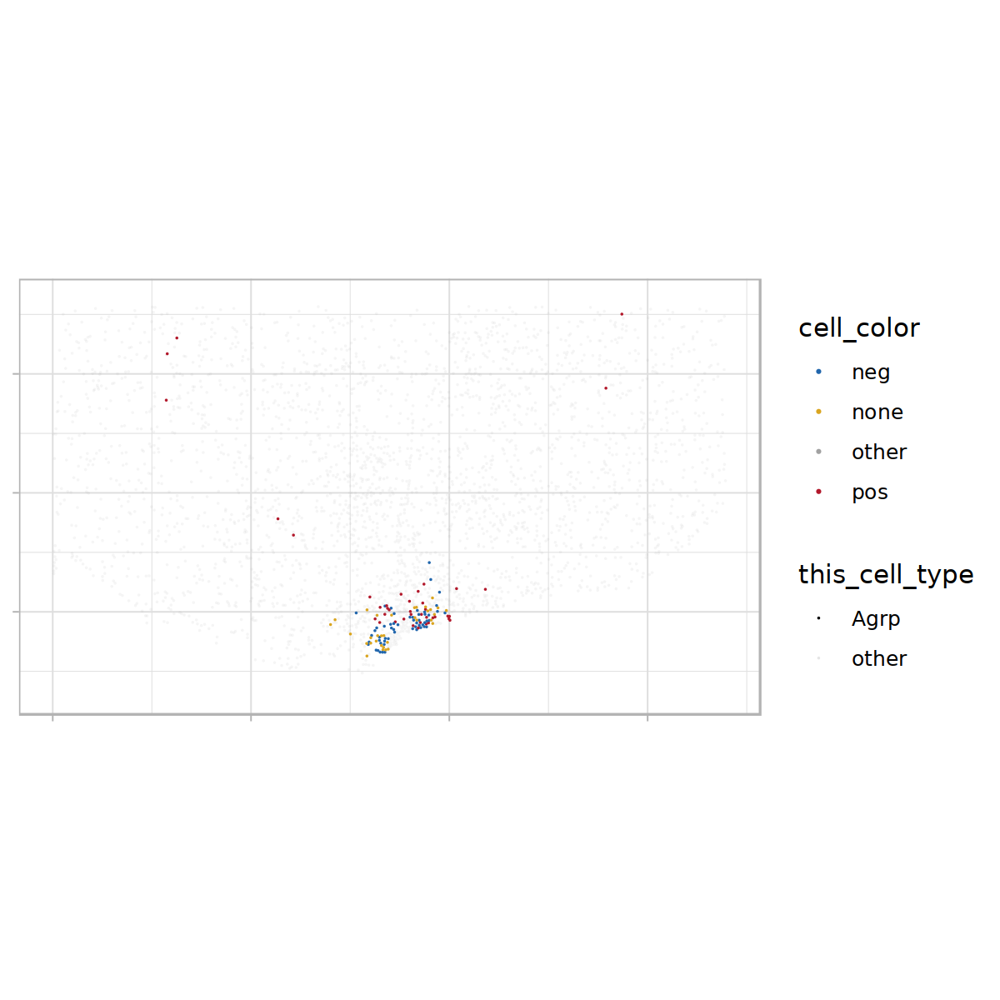

In [59]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res=200)
plot_single_slice_label(coord_comparison_df, 'A2', 'Agrp')

In [60]:
xe_obj %>% `[[` %>% distinct(labels) %>% filter(str_detect(labels, 'Pomc'))

,labels
,<chr>
Cell1024_1791_6614_1,Pomc__Ttr
Cell10538_2269_11100_1,Pomc__Anxa2
Cell11206_2073_11732_1,Pomc__Glipr1


In [61]:
plot_all_samples_polarity = function(coord_comparison_df, cell_type){
    p1 = plot_single_slice_label(coord_comparison_df, 'A1', cell_type)
    p2 = plot_single_slice_label(coord_comparison_df, 'A2', cell_type)
    p3 = plot_single_slice_label(coord_comparison_df, 'B1', cell_type)
    p4 = plot_single_slice_label(coord_comparison_df, 'B2', cell_type)
    p5 = plot_single_slice_label(coord_comparison_df, 'C1', cell_type)
    p6 = plot_single_slice_label(coord_comparison_df, 'C2', cell_type)
    p7 = plot_single_slice_label(coord_comparison_df, 'D1', cell_type)
    p8 = plot_single_slice_label(coord_comparison_df, 'D2', cell_type)
    
    layout <- '
    AE
    BF
    CG
    DH
    '

    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') 

    ggp
}

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


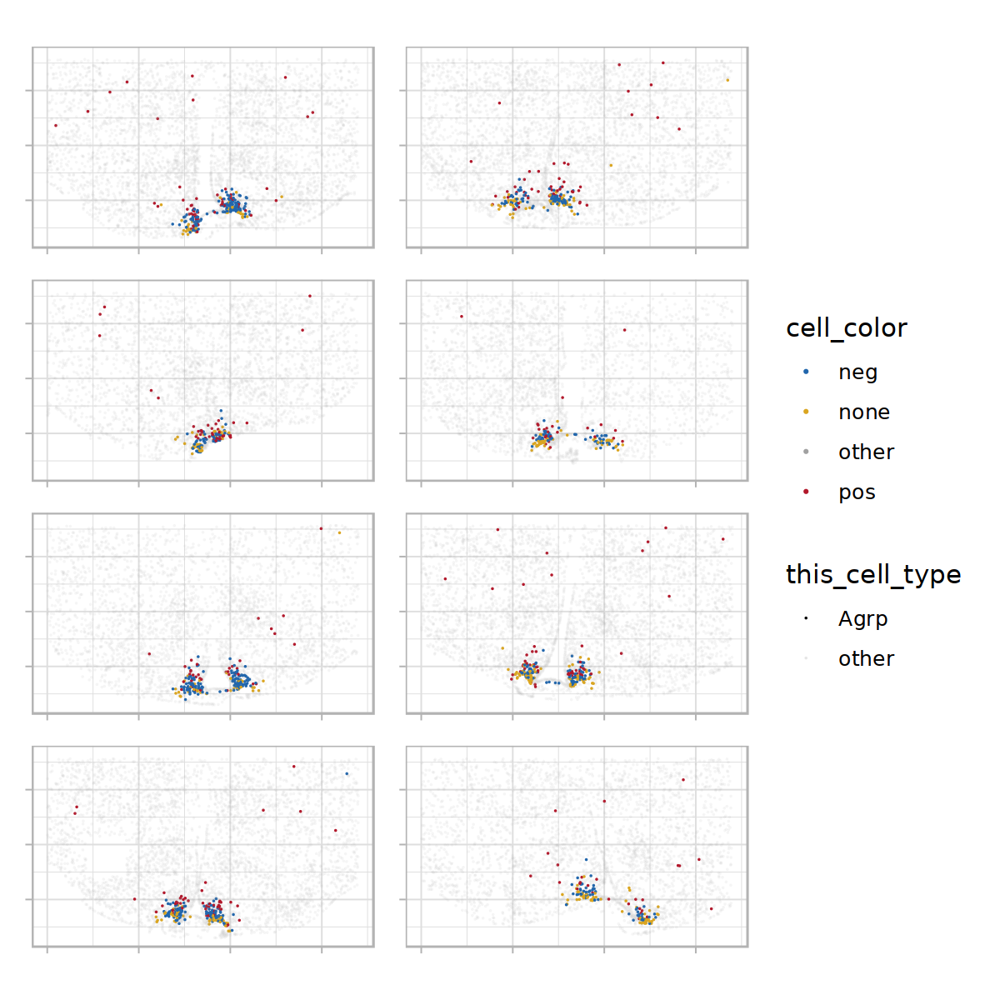

In [62]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res=200)
plot_all_samples_polarity(coord_comparison_df, 'Agrp')

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


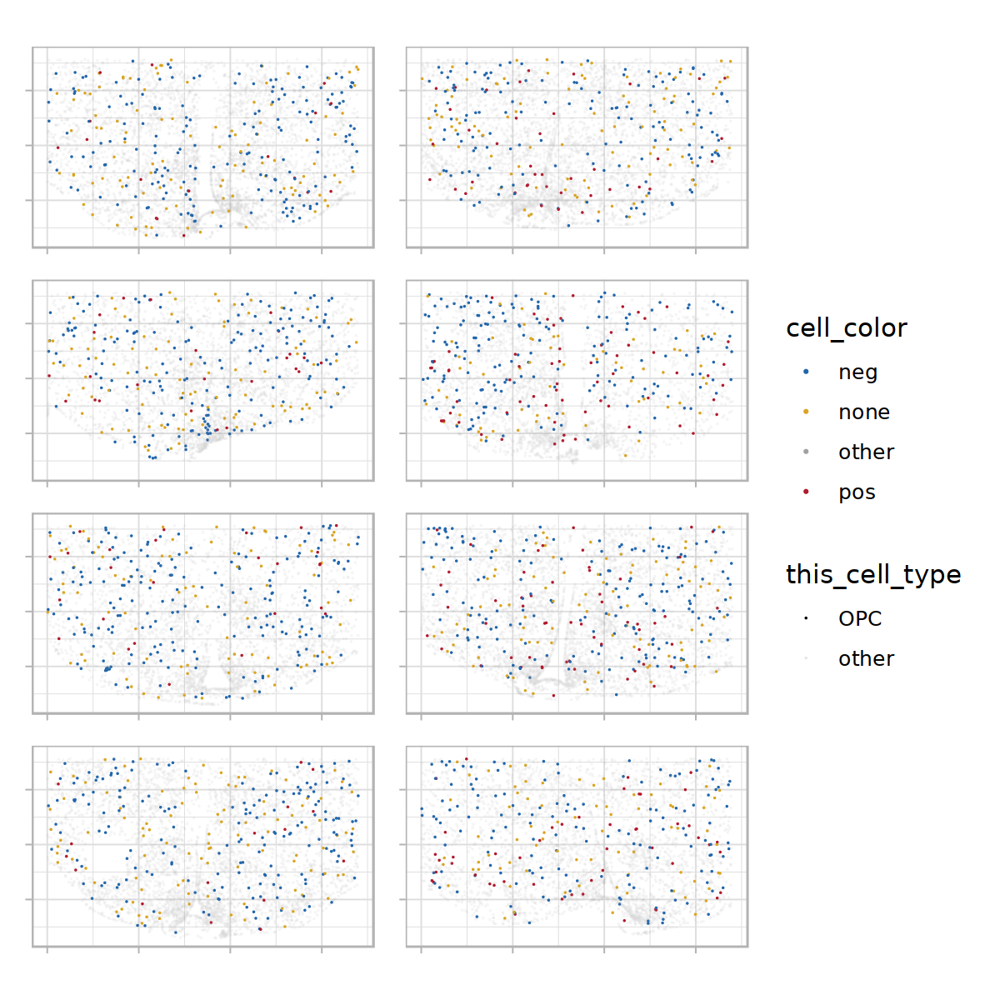

In [63]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res=200)
plot_all_samples_polarity(coord_comparison_df, 'OPC')

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


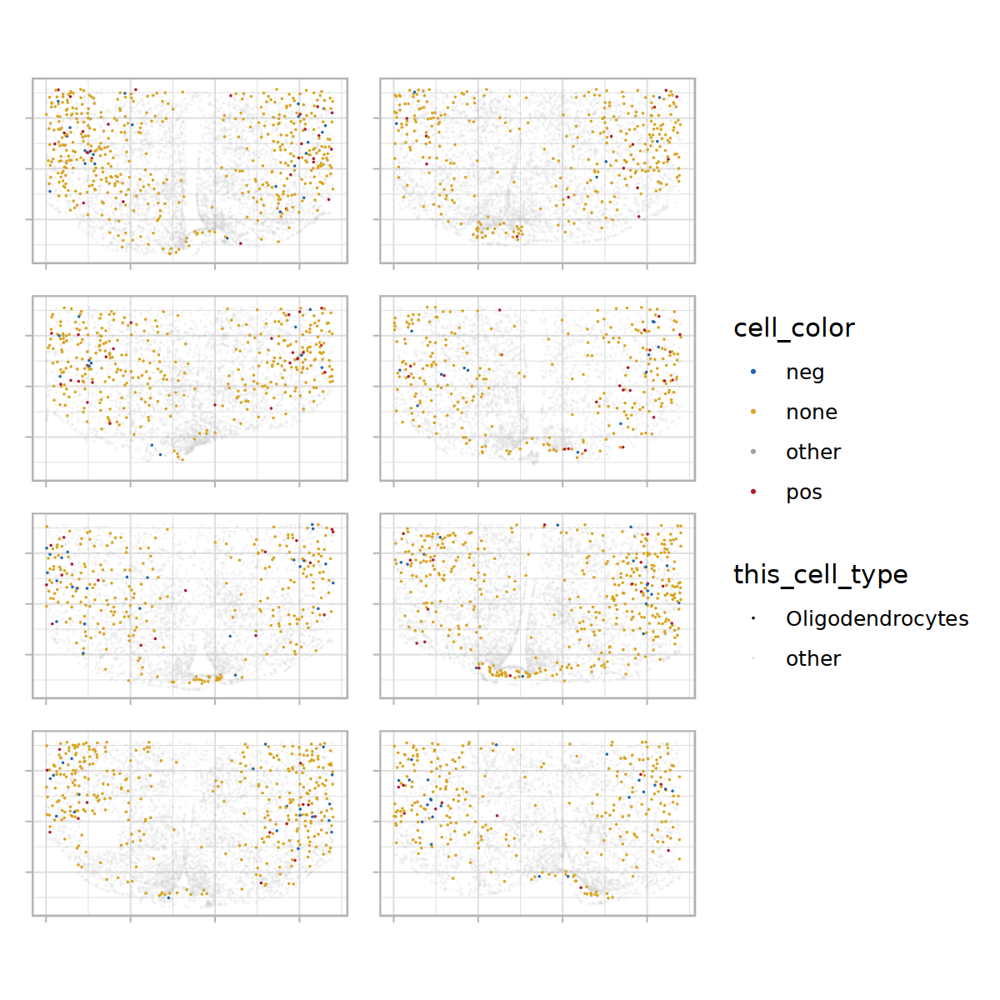

In [64]:
plot_all_samples_polarity(coord_comparison_df, 'Oligodendrocytes')

In [65]:
polarity_sig_df_wide = polarity_sig_df %>%
  pivot_wider(names_from = polarity, 
              values_from = c(pval, coef, z, significant, significant_adj, pval_corrected),
              names_sep = ".")

polarity_sig_df_wide

label,pval.pos,pval.neg,coef.pos,coef.neg,z.pos,z.neg,significant.pos,significant.neg,significant_adj.pos,significant_adj.neg,pval_corrected.pos,pval_corrected.neg
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
Agrp,6.407580e-04,5.145161e-08,-0.64796602,-0.9040324,-3.4137481,-5.4462196,**,**,**,**,2.242653e-03,3.601613e-07
Astrocytes,6.081354e-01,4.138204e-01,0.06543834,-0.1063311,0.5127369,-0.8171890,,,,,6.207551e-01,6.207551e-01
Ghrh,6.207551e-01,6.050439e-02,-0.26819094,-0.6815858,-0.4947805,-1.8771000,,,,,6.207551e-01,1.694123e-01
Htr3b,3.580835e-01,5.240554e-01,0.48385598,-0.3997698,0.9190231,-0.6371066,,,,,6.207551e-01,6.207551e-01
OPC,7.449326e-07,2.108334e-01,1.07090211,0.1406381,4.9492676,1.2512772,**,,**,,3.476352e-06,4.216668e-01
Oligodendrocytes,4.781204e-01,5.996348e-01,-0.13568908,-0.1040523,-0.7093290,-0.5249258,,,,,6.207551e-01,6.207551e-01
Tbx19__Pirt,7.778420e-02,0.000000e+00,-1.55461790,-5.5146509,-1.7636899,-8.0000000,,**,,**,1.814965e-01,0.000000e+00


In [66]:
sig_df = ncells_sig_df %>%
left_join(polarity_sig_df_wide, by='label')

# mutate(z.neg = ifelse(is.na(z.neg), 0, z.neg),
#        z.pos = ifelse(is.na(z.pos), 0, z.pos),
#        pval_corrected.neg = ifelse(is.na(pval_corrected.neg), 1, pval_corrected.neg),
#        pval_corrected.pos = ifelse(is.na(pval_corrected.pos), 1, pval_corrected.pos)) %>%
# mutate(sort_col = pval_corrected * pval_corrected.neg * pval_corrected.pos) %>%
# mutate(sort_col = sign(zscore) * abs(zscore * z.pos * z.neg)) %>%

counts_for_sig = summary_df %>% filter(predicted.label %in% c(sig_df %>% filter(pval_corrected < 0.05 | pval_corrected.neg < 0.05 | pval_corrected.pos < 0.05) %>% pull (label))                            
                     ) %>%
select(predicted.label, polarity, FGF1_minus_VehPF_polar, label_diff) %>%
  # Use pivot_wider to spread the data
  pivot_wider(
    names_from = polarity, 
    values_from = c(FGF1_minus_VehPF_polar, label_diff),
    names_sep = "_"
  ) %>%
  select(-label_diff_neg, -label_diff_pos) %>%
  rename(label = predicted.label)

sig_df = sig_df %>%
left_join(counts_for_sig, by = 'label') %>%
mutate(sort_col = zscore) %>%
arrange(desc(sort_col)) %>%
mutate(label = factor(label, levels=label))

sig_df %>% head

label,pval,coef,zscore,pval_corrected,significant,significant_adj,pval.pos,pval.neg,coef.pos,⋯,significant.neg,significant_adj.pos,significant_adj.neg,pval_corrected.pos,pval_corrected.neg,FGF1_minus_VehPF_polar_none,FGF1_minus_VehPF_polar_neg,FGF1_minus_VehPF_polar_pos,label_diff_none,sort_col
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<dbl>
b1_Tanycytes,2.324957e-05,0.5055301,4.231154,0.001255477,**,**,NA,NA,NA,⋯,NA,NA,NA,NA,NA,72,NA,NA,72,4.231154
b2_Tanycytes,1.699690e-03,0.6046320,3.138234,0.045891635,**,**,NA,NA,NA,⋯,NA,NA,NA,NA,NA,191,NA,NA,191,3.138234
Microglia,1.482490e-02,0.3734063,2.436628,0.266848240,**,,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,2.436628
Tmem215__Dach2,5.237857e-02,1.5152634,1.940009,0.435324896,,,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.940009
Met__Pappa2,5.483643e-02,0.3852849,1.920170,0.435324896,,,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.920170
Reln__Lef1,6.886908e-02,0.4748351,1.819278,0.435324896,,,NA,NA,NA,⋯,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.819278


In [67]:
summary_df %>% filter(predicted.label %in% c(sig_df %>% filter(pval_corrected < 0.05 | pval_corrected.neg < 0.05 | pval_corrected.pos < 0.05) %>% pull (label)))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
b2_Tanycytes.none,445,254,191,b2_Tanycytes,none,445,254,191,0.75196850,13966,14116,-150
Agrp.neg,243,383,-140,Agrp,neg,628,720,-92,-0.12777778,13966,14116,-150
Agrp.none,231,154,77,Agrp,none,628,720,-92,-0.12777778,13966,14116,-150
Agrp.pos,154,183,-29,Agrp,pos,628,720,-92,-0.12777778,13966,14116,-150
b1_Tanycytes.none,186,114,72,b1_Tanycytes,none,186,114,72,0.63157895,13966,14116,-150
OPC.neg,660,747,-87,OPC,neg,1194,1226,-32,-0.02610114,13966,14116,-150
OPC.none,323,395,-72,OPC,none,1194,1226,-32,-0.02610114,13966,14116,-150
OPC.pos,211,84,127,OPC,pos,1194,1226,-32,-0.02610114,13966,14116,-150
Tbx19__Pirt.neg,1,5,-4,Tbx19__Pirt,neg,48,51,-3,-0.05882353,13966,14116,-150


In [68]:
sig_df %>% filter(!is.na(label_diff_none))

label,pval,coef,zscore,pval_corrected,significant,significant_adj,pval.pos,pval.neg,coef.pos,⋯,significant.neg,significant_adj.pos,significant_adj.neg,pval_corrected.pos,pval_corrected.neg,FGF1_minus_VehPF_polar_none,FGF1_minus_VehPF_polar_neg,FGF1_minus_VehPF_polar_pos,label_diff_none,sort_col
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<chr>,<chr>,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<dbl>
b1_Tanycytes,2.324957e-05,0.50553006,4.2311538,0.001255477,**,**,NA,NA,NA,⋯,NA,NA,NA,NA,NA,72,NA,NA,72,4.2311538
b2_Tanycytes,1.699690e-03,0.60463198,3.1382342,0.045891635,**,**,NA,NA,NA,⋯,NA,NA,NA,NA,NA,191,NA,NA,191,3.1382342
Tbx19__Pirt,8.722623e-01,-0.04507548,-0.1607856,0.969484943,,,7.778420e-02,0.000000e+00,-1.554618,⋯,**,,**,1.814965e-01,0.000000e+00,5,-4,-4,-3,-0.1607856
OPC,8.627109e-01,-0.01836970,-0.1729244,0.969484943,,,7.449326e-07,2.108334e-01,1.070902,⋯,,**,,3.476352e-06,4.216668e-01,-72,-87,127,-32,-0.1729244
Agrp,5.976956e-02,-0.13391326,-1.8824897,0.435324896,,,6.407580e-04,5.145161e-08,-0.647966,⋯,**,**,**,2.242653e-03,3.601613e-07,77,-140,-29,-92,-1.8824897


Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”


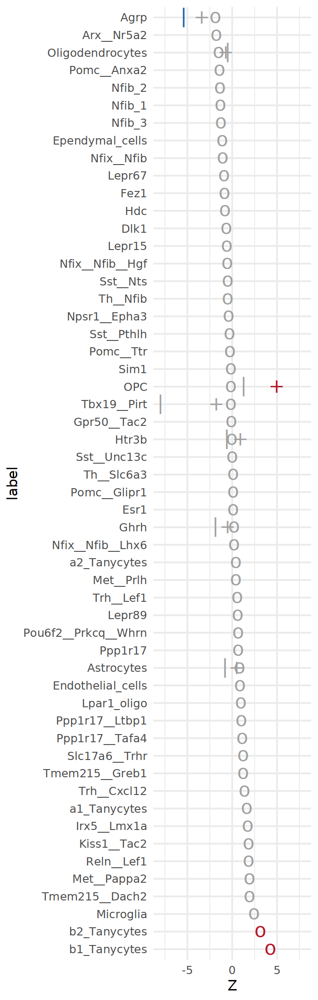

In [69]:
options(repr.plot.width=3.5, repr.plot.height=11)

# Convert 'label' column to a factor
sig_df$label <- as.factor(sig_df$label)

# Define conditions for colors
sig_df$zscore_col <- ifelse(sig_df$zscore > 0 & sig_df$significant_adj == '**' & abs(sig_df$label_diff_none) >= 50, "#b2182b",
                            ifelse(sig_df$zscore < 0 & sig_df$significant_adj == '**' & abs(sig_df$label_diff_none) >= 50, "#2166ac", "#a1a1a1"))
sig_df$zpos_col <- ifelse(sig_df$z.pos > 0 & sig_df$significant_adj.pos == '**' & abs(sig_df$FGF1_minus_VehPF_polar_pos) >= 50, "#b2182b",
                         ifelse(sig_df$z.pos < 0 & sig_df$significant_adj.pos == '**' & abs(sig_df$FGF1_minus_VehPF_polar_pos) >= 50, "#2166ac", "#a1a1a1"))
sig_df$zneg_col <- ifelse(sig_df$z.neg > 0 & sig_df$significant_adj.neg == '**' & abs(sig_df$FGF1_minus_VehPF_polar_neg) >= 50, "#b2182b",
                         ifelse(sig_df$z.neg < 0 & sig_df$significant_adj.neg == '**' & abs(sig_df$FGF1_minus_VehPF_polar_neg) >= 50, "#2166ac", "#a1a1a1"))

# Create the scatter plot
ggp_sig = ggplot(sig_df) +
  # Add a scatter plot for 'zscore'
  geom_point(aes(y = label, x = zscore, color = zscore_col), shape = 'o', size = 5) +
  # Add a scatter plot for 'z.pos'
  geom_point(aes(y = label, x = z.pos, color = zpos_col), shape = '+', size = 5) +
  # Add a scatter plot for 'z.neg'
  geom_point(aes(y = label, x = z.neg, color = zneg_col), shape = '|', size = 5) +
  # Specify the colors for each condition
  scale_color_identity() +
  # Set the x-axis limits
  scale_x_continuous(limits = c(-8, 8)) +
  # Add the plot title and labels
  labs(x = "Z") +
  # Set the plot theme
  theme_minimal()

ggp_sig

In [70]:
summary_df %>% filter(predicted.label %in% c(sig_df %>% filter(pval_corrected < 0.05 | pval_corrected.neg < 0.05 | pval_corrected.pos < 0.05) %>% pull (label))
                                            
                     ) %>%
select(predicted.label, polarity, FGF1_minus_VehPF_polar, label_diff) %>%
rename(label = predicted.label) %>%
print

# A tibble: 11 × 4
   label        polarity FGF1_minus_VehPF_polar label_diff
   <chr>        <chr>                     <int>      <int>
 1 b2_Tanycytes none                        191        191
 2 Agrp         neg                        -140        -92
 3 Agrp         none                         77        -92
 4 Agrp         pos                         -29        -92
 5 b1_Tanycytes none                         72         72
 6 OPC          neg                         -87        -32
 7 OPC          none                        -72        -32
 8 OPC          pos                         127        -32
 9 Tbx19__Pirt  neg                          -4         -3
10 Tbx19__Pirt  none                          5         -3
11 Tbx19__Pirt  pos                          -4         -3


In [71]:
summary_df %>% filter(predicted.label %in% c(sig_df %>% filter(pval_corrected < 0.05 | pval_corrected.neg < 0.05 | pval_corrected.pos < 0.05) %>% pull (label))
                                            
                     )

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
b2_Tanycytes.none,445,254,191,b2_Tanycytes,none,445,254,191,0.75196850,13966,14116,-150
Agrp.neg,243,383,-140,Agrp,neg,628,720,-92,-0.12777778,13966,14116,-150
Agrp.none,231,154,77,Agrp,none,628,720,-92,-0.12777778,13966,14116,-150
Agrp.pos,154,183,-29,Agrp,pos,628,720,-92,-0.12777778,13966,14116,-150
b1_Tanycytes.none,186,114,72,b1_Tanycytes,none,186,114,72,0.63157895,13966,14116,-150
OPC.neg,660,747,-87,OPC,neg,1194,1226,-32,-0.02610114,13966,14116,-150
OPC.none,323,395,-72,OPC,none,1194,1226,-32,-0.02610114,13966,14116,-150
OPC.pos,211,84,127,OPC,pos,1194,1226,-32,-0.02610114,13966,14116,-150
Tbx19__Pirt.neg,1,5,-4,Tbx19__Pirt,neg,48,51,-3,-0.05882353,13966,14116,-150


In [72]:
sig_df %>% filter(pval_corrected < 0.05 | pval_corrected.neg < 0.05 | pval_corrected.pos < 0.05) 

label,pval,coef,zscore,pval_corrected,significant,significant_adj,pval.pos,pval.neg,coef.pos,⋯,pval_corrected.pos,pval_corrected.neg,FGF1_minus_VehPF_polar_none,FGF1_minus_VehPF_polar_neg,FGF1_minus_VehPF_polar_pos,label_diff_none,sort_col,zscore_col,zpos_col,zneg_col
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<int>,<int>,<int>,<int>,<dbl>,<chr>,<chr>,<chr>
b1_Tanycytes,2.324957e-05,0.50553006,4.2311538,0.001255477,**,**,NA,NA,NA,⋯,NA,NA,72,NA,NA,72,4.2311538,#b2182b,NA,NA
b2_Tanycytes,1.699690e-03,0.60463198,3.1382342,0.045891635,**,**,NA,NA,NA,⋯,NA,NA,191,NA,NA,191,3.1382342,#b2182b,NA,NA
Tbx19__Pirt,8.722623e-01,-0.04507548,-0.1607856,0.969484943,,,7.778420e-02,0.000000e+00,-1.554618,⋯,1.814965e-01,0.000000e+00,5,-4,-4,-3,-0.1607856,#a1a1a1,#a1a1a1,#a1a1a1
OPC,8.627109e-01,-0.01836970,-0.1729244,0.969484943,,,7.449326e-07,2.108334e-01,1.070902,⋯,3.476352e-06,4.216668e-01,-72,-87,127,-32,-0.1729244,#a1a1a1,#b2182b,#a1a1a1
Agrp,5.976956e-02,-0.13391326,-1.8824897,0.435324896,,,6.407580e-04,5.145161e-08,-0.647966,⋯,2.242653e-03,3.601613e-07,77,-140,-29,-92,-1.8824897,#a1a1a1,#a1a1a1,#2166ac


In [73]:
sig_df %>% filter(label == 'Agrp') %>% select(label, zscore,  zscore_col, z.neg, zneg_col, z.pos,  zpos_col)

label,zscore,zscore_col,z.neg,zneg_col,z.pos,zpos_col
<fct>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<chr>
Agrp,-1.88249,#a1a1a1,-5.44622,#2166ac,-3.413748,#a1a1a1


In [74]:
plot_all_samples_polarity_2row = function(coord_comparison_df, cell_type, pt_size=0.2){
    p1 = plot_single_slice_label(coord_comparison_df, 'A1', cell_type, pt_size=pt_size) + theme(legend.position = "none") + labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label(coord_comparison_df, 'A2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p3 = plot_single_slice_label(coord_comparison_df, 'B1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p4 = plot_single_slice_label(coord_comparison_df, 'B2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p5 = plot_single_slice_label(coord_comparison_df, 'C1', cell_type, pt_size=pt_size) + theme(legend.position = "none") + labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label(coord_comparison_df, 'C2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p7 = plot_single_slice_label(coord_comparison_df, 'D1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p8 = plot_single_slice_label(coord_comparison_df, 'D2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    label_plot <- ggplot() +
      labs(y = cell_type) +
      theme_void()

    
    layout <- '
    ABCD
    EFGH
    '

    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0))

    ggp
}

In [75]:
p_Microglia = plot_all_samples_polarity_2row(coord_comparison_df, 'Microglia')
p_MOL = plot_all_samples_polarity_2row(coord_comparison_df, 'Oligodendrocytes')
p_Trh_Lef1 = plot_all_samples_polarity_2row(coord_comparison_df, 'Trh_Lef1')
p_Astrocytes = plot_all_samples_polarity_2row(coord_comparison_df, 'Astrocytes')
p_a1_Tany__Astrocytes = plot_all_samples_polarity_2row(coord_comparison_df, 'a1_Tany__Astrocytes')
p_a2_Tanycytes = plot_all_samples_polarity_2row(coord_comparison_df, 'a2_Tanycytes')
p_NFOL = plot_all_samples_polarity_2row(coord_comparison_df, 'NFOL')
p_Agrp = plot_all_samples_polarity_2row(coord_comparison_df, 'Agrp')
p_Rgs16_Dlx1 = plot_all_samples_polarity_2row(coord_comparison_df, 'Rgs16_Dlx1')


p_Lepr89 = plot_all_samples_polarity_2row(coord_comparison_df, 'Lepr89')
p_Astrocytes = plot_all_samples_polarity_2row(coord_comparison_df, 'Astrocytes')
p_OPC = plot_all_samples_polarity_2row(coord_comparison_df, 'OPC')
p_Agrp = plot_all_samples_polarity_2row(coord_comparison_df, 'Agrp')
p_Tany = coord_comparison_df %>% mutate(label = case_when(str_detect(label, 'Tanycytes') ~ 'Tanycytes',
                                                          TRUE ~ label)) %>% plot_all_samples_polarity_2row('Tanycytes')

In [76]:
options(repr.plot.width=8.5, repr.plot.height=11)
layout <- '
ABBBBBB
ACCCCCC
ADDDDDD
AEEEEEE
AFFFFFF
AGGGGGG
AHHHHHH
'

ggp = wrap_plots(A = ggp_sig,
           B = p_Microglia,
           C = p_MOL,
           D = p_Trh_Lef1,
           E = p_Astrocytes,
           F = p_a1_Tany__Astrocytes,
           G = p_a2_Tanycytes,
           H = p_NFOL,
    design = layout) +
plot_layout(guides = 'auto') 

In [77]:
options(repr.plot.width=8.5, repr.plot.height=11)
layout <- '
ABBBBBB
ACCCCCC
ADDDDDD
AEEEEEE
AFFFFFF
'

ggp = wrap_plots(A = ggp_sig,
           B = p_Agrp,
           C = p_OPC,
           D = p_Tany,
           E = p_MOL,
           F = p_Astrocytes,
    design = layout) +
plot_layout(guides = 'auto') 

In [78]:
ggp %>% ggsave("spatial_sig_plots_rctd.pdf", ., width = 7, height = 9)

Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing val

In [79]:
ggp %>% ggsave("spatial_sig_plots_rctd.png", ., width = 8.5, height = 11)

Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing val

In [80]:
plot_single_slice_label_ct = function(coord_comparison_df, sample, cell_type, pt_size=0.1){
    ggp = coord_comparison_df %>%
        filter(sample_name == sample)%>%
        mutate(this_cell_type = case_when(label == cell_type ~ !!cell_type,
                                          TRUE ~ 'other'),
               random_column = sample(1:n(), size = n(), replace = TRUE),
               polarity_factor = factor(polarity, levels = c('none', 'pos', 'neg')),
               cell_type_factor = factor(label == cell_type, levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(polarity))) %>%
        arrange(random_column, cell_type_factor, polarity_factor) %>% #cell plotting order determined here
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(values = c('none' =  "#000000",
                                        'pos' = "#000000",
                                        'neg' = "#000000",
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = setNames(c("other" = 16, "this" = 16), c("other", cell_type))) +
          scale_alpha_manual(values = setNames(c("other" = 0.1, "this" = 1), c("other", cell_type))) +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank()    # Remove y-axis labels
        )
    
    ggp
}


Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”


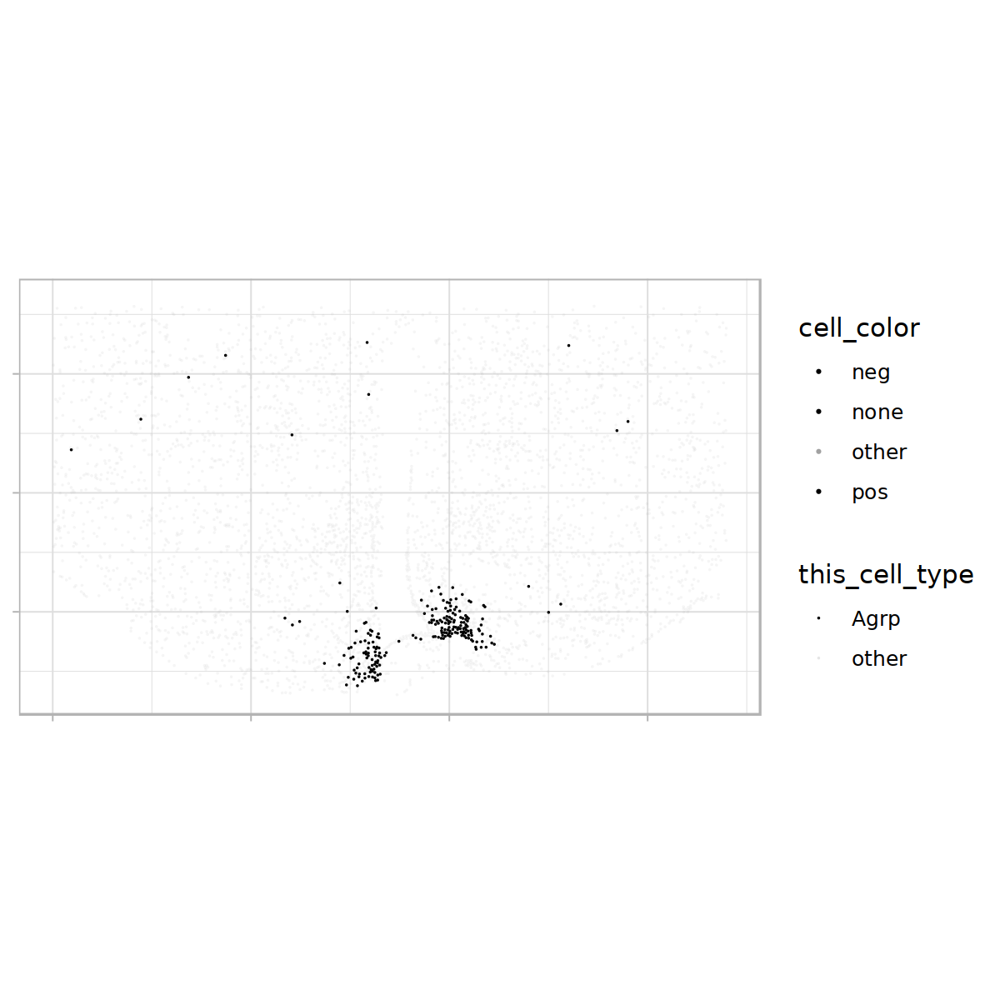

In [81]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res=200)
plot_single_slice_label_ct(coord_comparison_df, 'A1', 'Agrp')

In [82]:
plot_all_samples_ct_2col = function(coord_comparison_df, cell_type, pt_size=0.2){
    p1 = plot_single_slice_label_ct(coord_comparison_df, 'A1', cell_type, pt_size=pt_size) + theme(legend.position = "none") #+ labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label_ct(coord_comparison_df, 'A2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p3 = plot_single_slice_label_ct(coord_comparison_df, 'B1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p4 = plot_single_slice_label_ct(coord_comparison_df, 'B2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p5 = plot_single_slice_label_ct(coord_comparison_df, 'C1', cell_type, pt_size=pt_size) + theme(legend.position = "none") #+ labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label_ct(coord_comparison_df, 'C2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p7 = plot_single_slice_label_ct(coord_comparison_df, 'D1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p8 = plot_single_slice_label_ct(coord_comparison_df, 'D2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    label_plot <- ggplot() +
      labs(y = cell_type) +
      theme_void()

    
    layout <- '
AE
BF
CG
DH
'

    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0))

    ggp
}

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


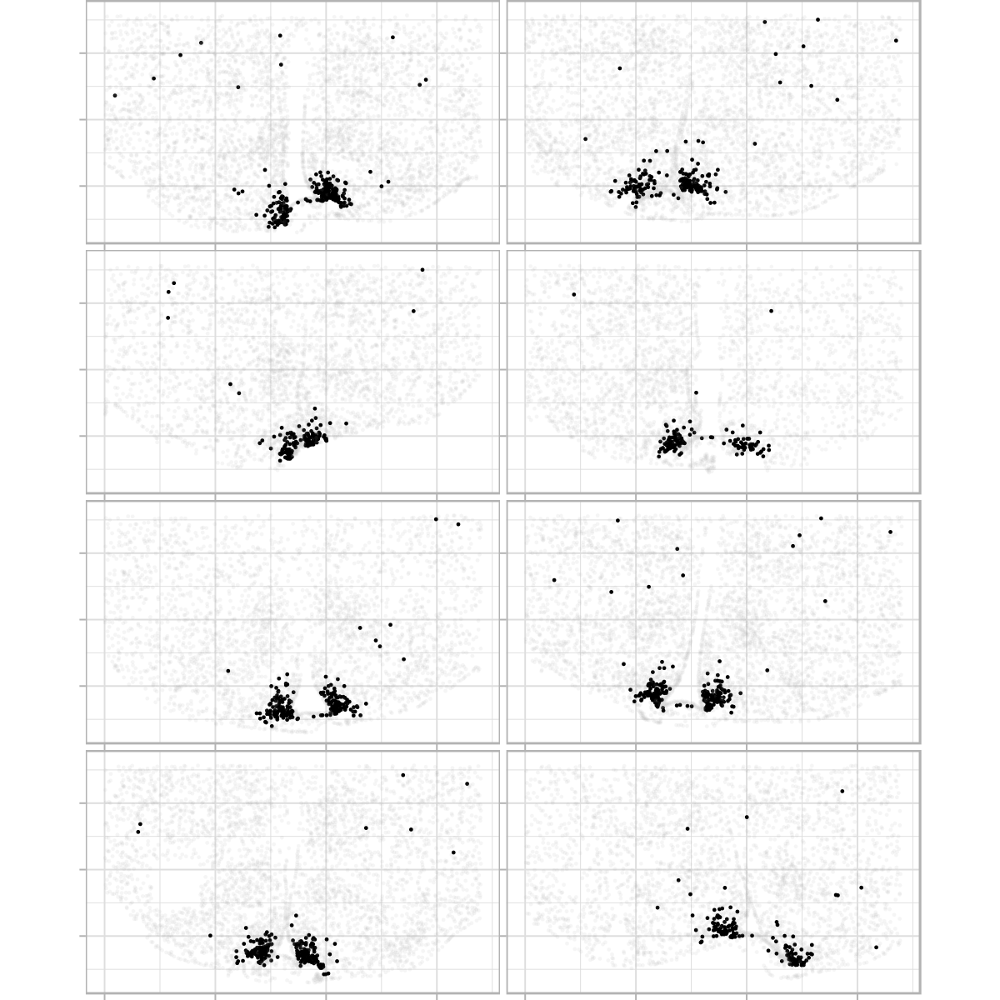

In [83]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res=200)
plot_all_samples_ct_2col(coord_comparison_df, 'Agrp', pt_size=0.3)

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


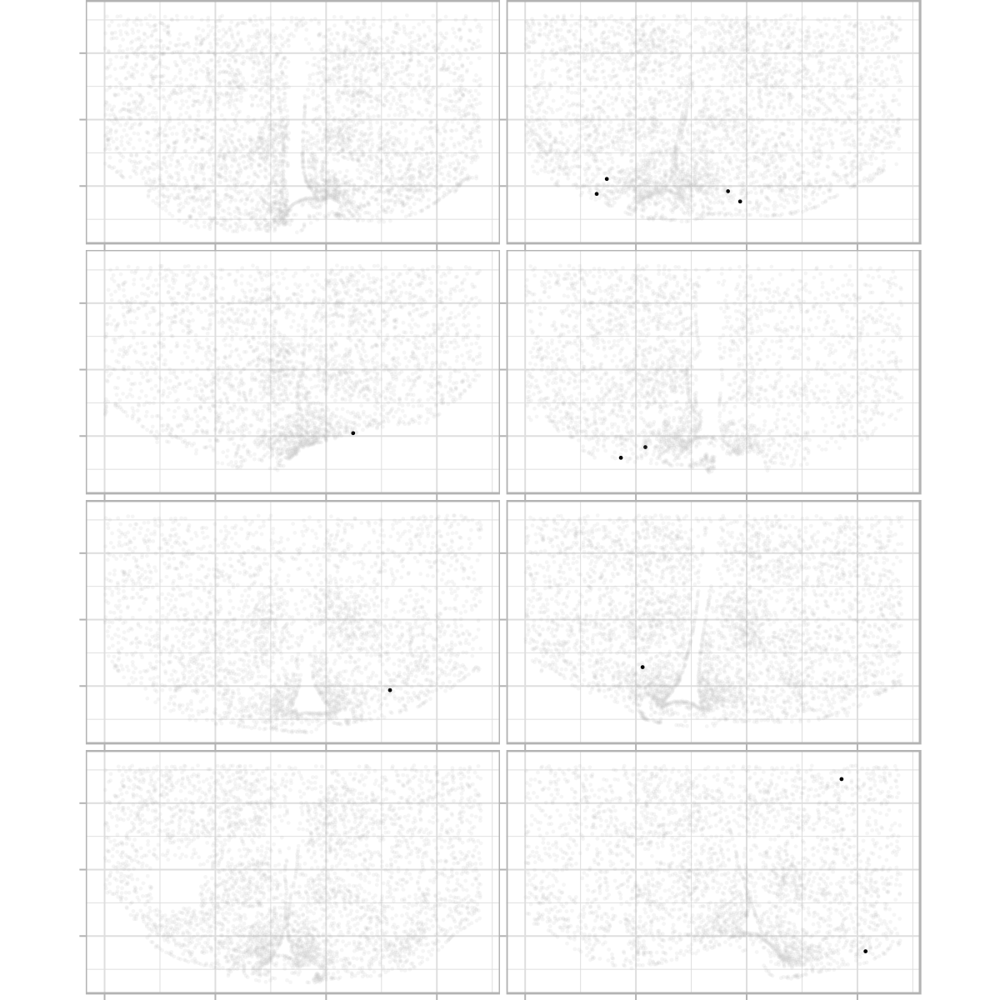

In [84]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res=200)
plot_all_samples_ct_2col(coord_comparison_df, 'Tmem215__Dach2', pt_size=0.3)

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


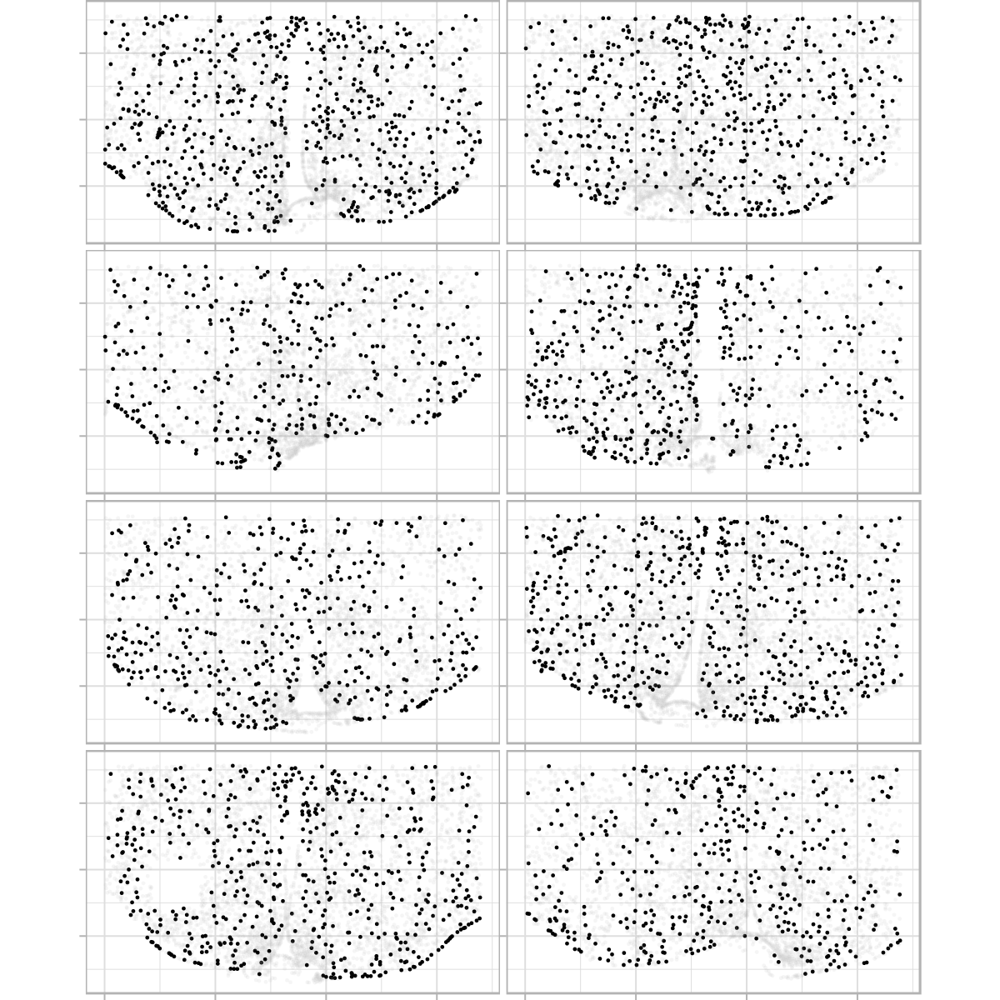

In [85]:
options(repr.plot.width=6, repr.plot.height=6, repr.plot.res=200)
plot_all_samples_ct_2col(coord_comparison_df, 'Astrocytes', pt_size=0.3)

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


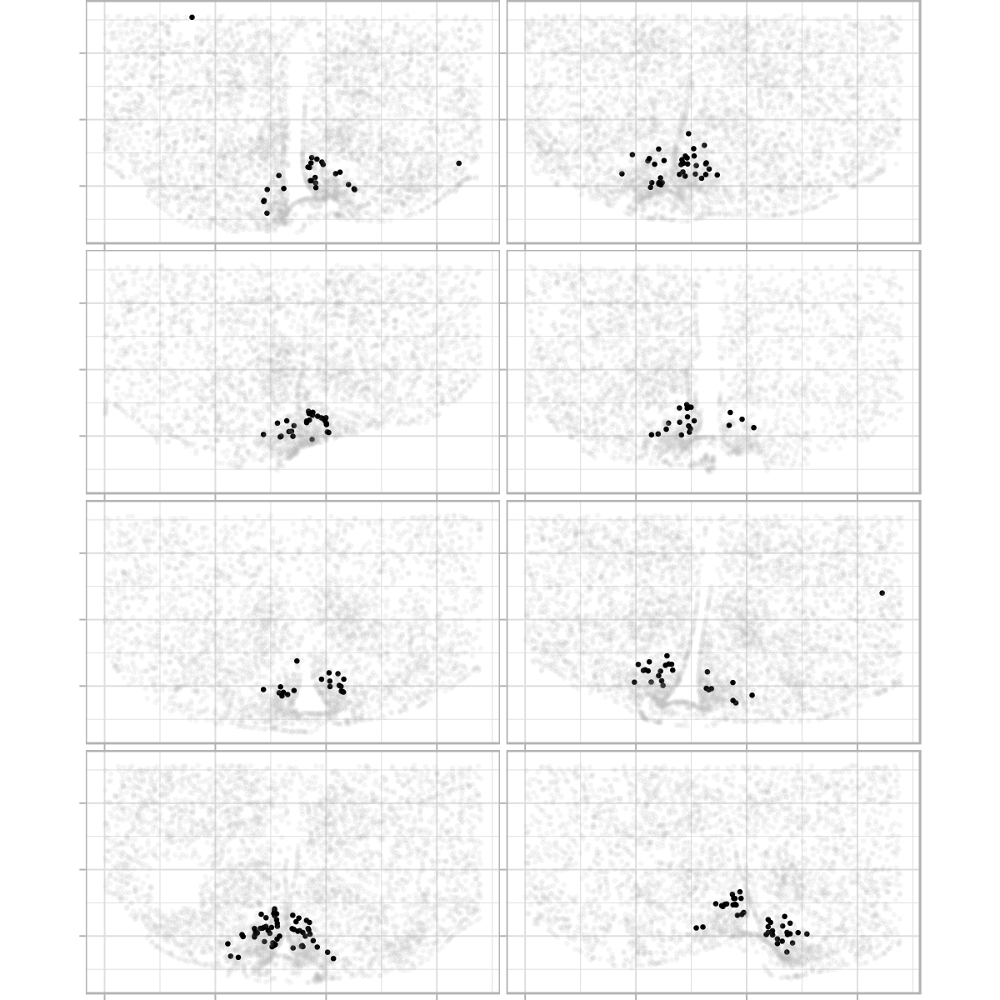

In [86]:
plot_all_samples_ct_2col(coord_comparison_df, 'Htr3b', pt_size=0.6)

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


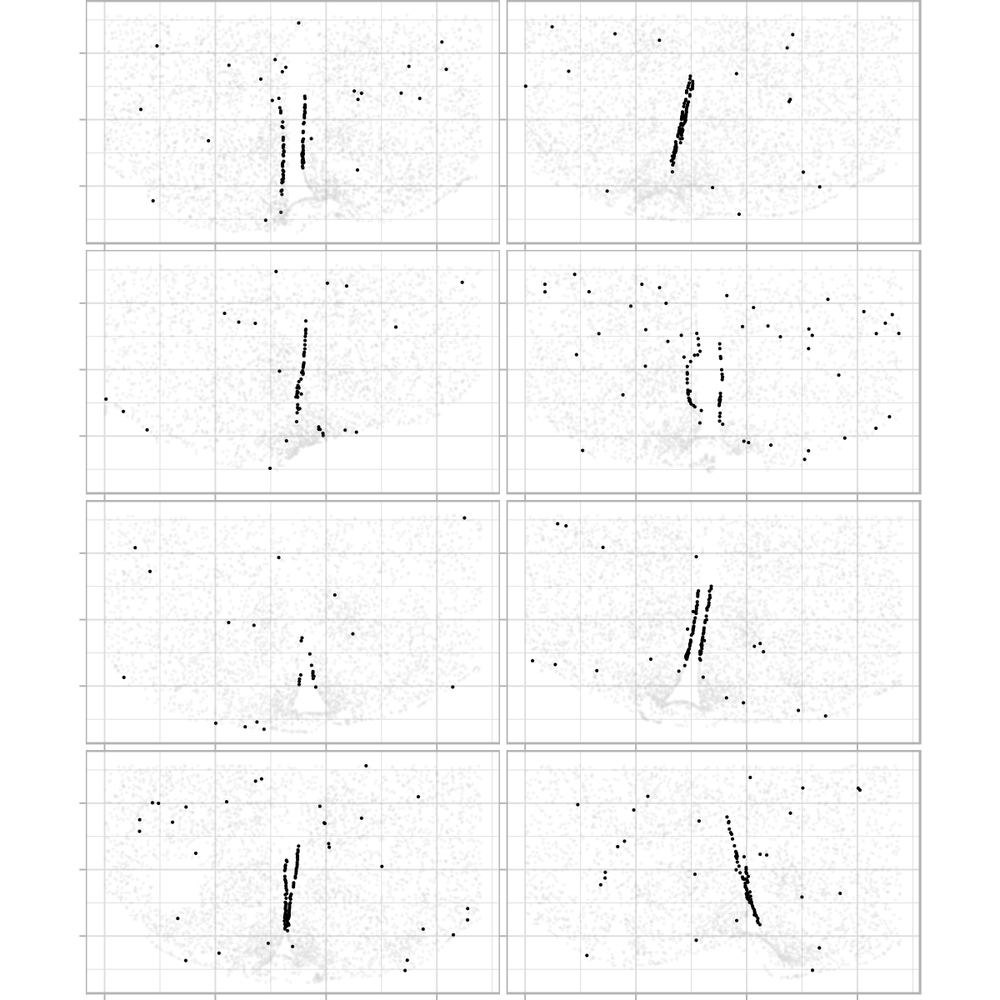

In [87]:
plot_all_samples_ct_2col(coord_comparison_df, 'a1_Tanycytes')

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


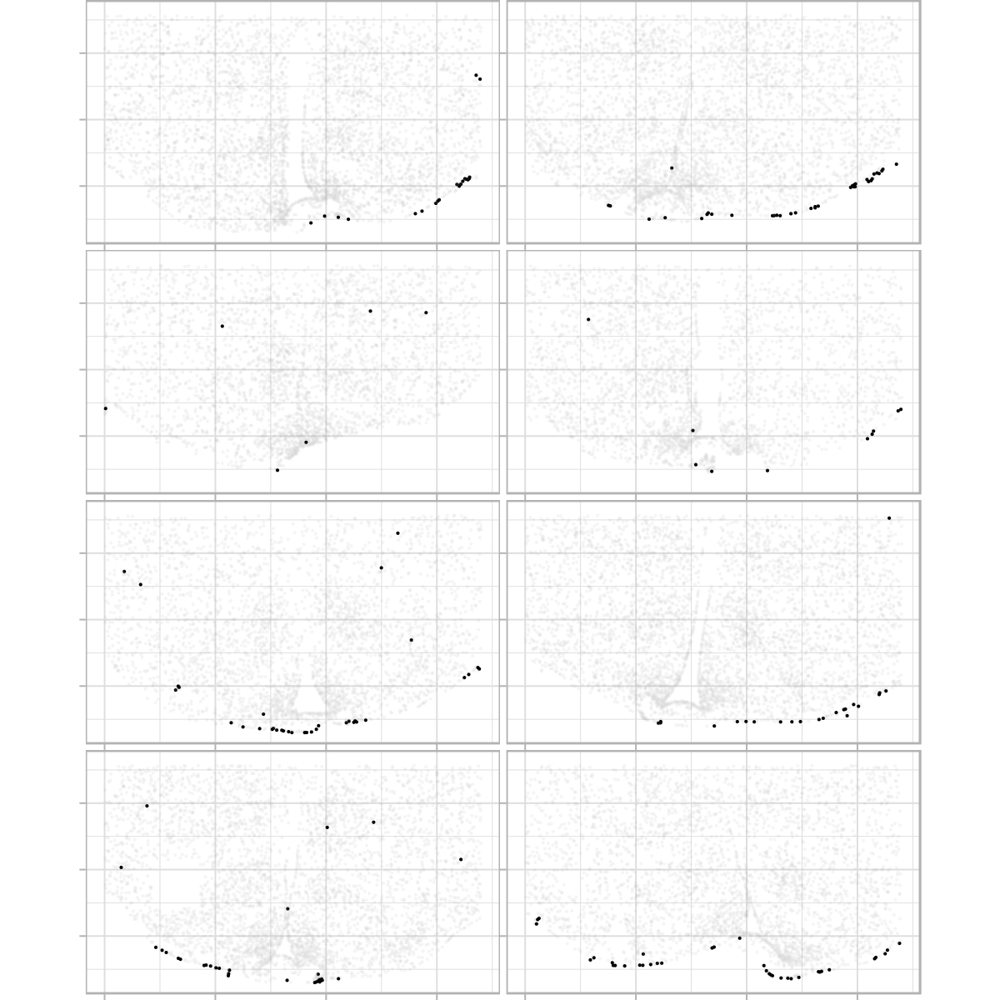

In [88]:
plot_all_samples_ct_2col(coord_comparison_df, 'a2_Tanycytes')

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


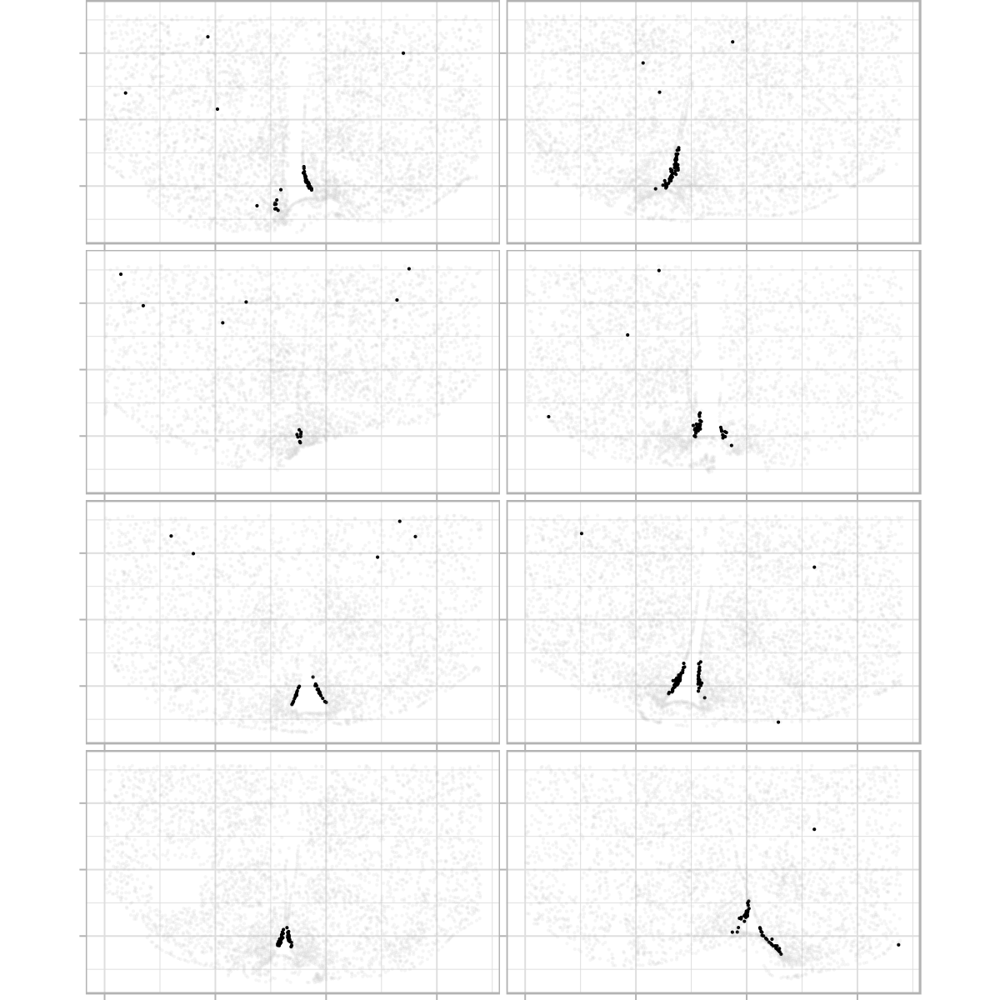

In [89]:
plot_all_samples_ct_2col(coord_comparison_df, 'b1_Tanycytes')

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


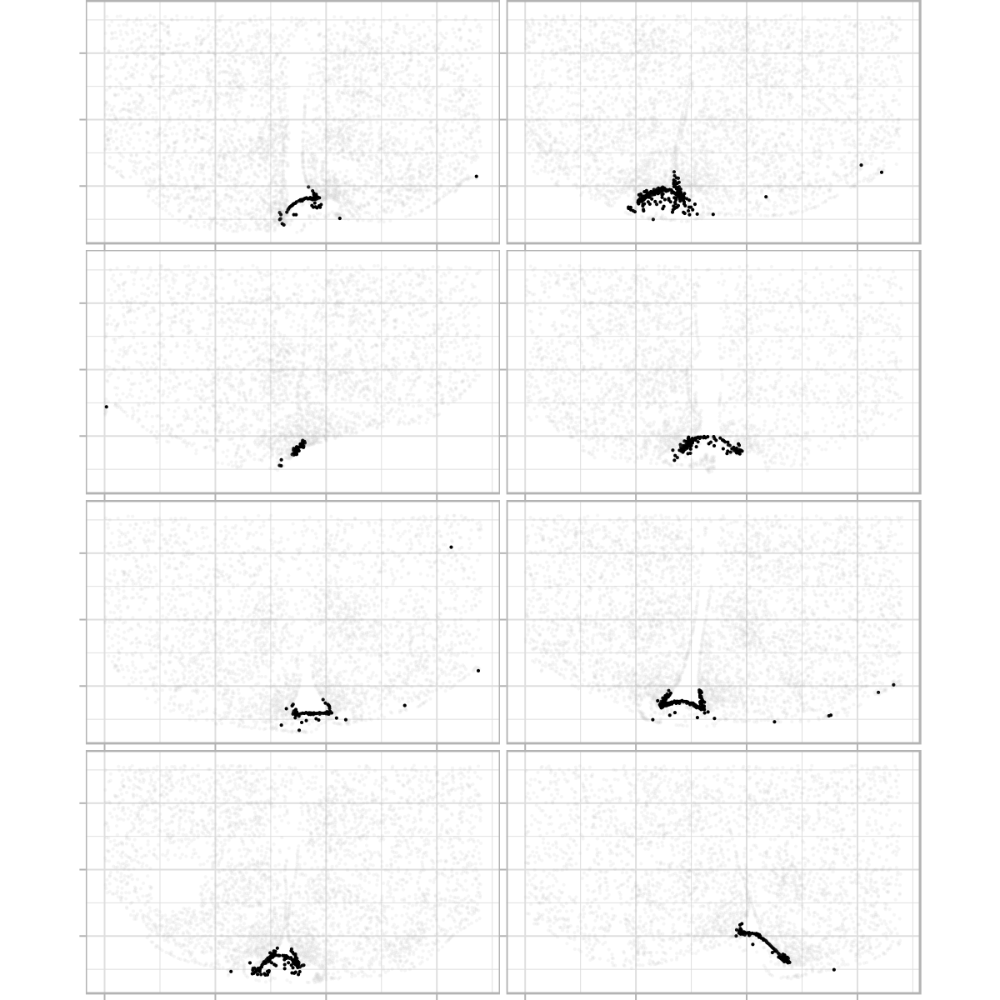

In [90]:
plot_all_samples_ct_2col(coord_comparison_df, 'b2_Tanycytes')

In [110]:
plot_single_slice_label_ct_tany = function(coord_comparison_df, sample, pt_size=0.1){
    tany_regex = "^(a1_Tanycytes|a2_Tanycytes|b1_Tanycytes|b2_Tanycytes)$"
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(str_detect(label, tany_regex) ~ label,
                                          TRUE ~ 'other'),
                random_column = sample(1:n(), size = n(), replace = TRUE),
               cell_type_factor = factor(str_detect(label, tany_regex), levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(this_cell_type))) %>%
        arrange(random_column, cell_type_factor) %>% #cell plotting order determined here
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(name = 'cell type',
                             values = c('a2_Tanycytes' =  "#e7d4e8",
                                        'a1_Tanycytes' = "#af8dc3",
                                        'b1_Tanycytes' = "#7fbf7b",
                                        'b2_Tanycytes' = "#1b7837",
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = c("other" = 16,
                                        'a2_Tanycytes' = 16,
                                        'a1_Tanycytes' = 16,
                                        'b1_Tanycytes' = 16,
                                        'b2_Tanycytes' = 16),
                             guide = 'none') +
          scale_alpha_manual(values = c("other" = 0.1,
                                        'a2_Tanycytes' = 1,
                                        'a1_Tanycytes' = 1,
                                        'b1_Tanycytes' = 1,
                                        'b2_Tanycytes' = 1),
                             guide='none') +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank(),    # Remove y-axis labels
              legend.position = "right", 
              legend.key.size = unit(0.3, "cm"),
              legend.text = element_text(lineheight=0.5, size = 6)

        )
    
    ggp
}


Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”


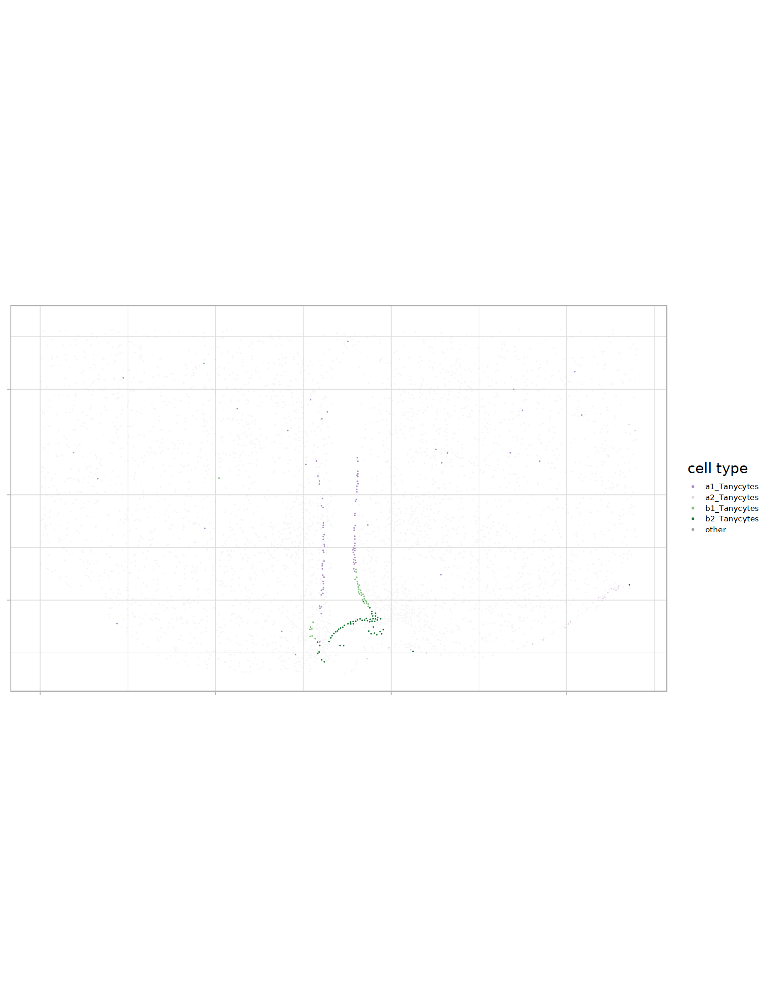

In [111]:
plot_single_slice_label_ct_tany(coord_comparison_df, 'A1')

In [112]:
plot_all_samples_ct_tany = function(coord_comparison_df, pt_size=0.1, plot_shape='2col'){
    p1 = plot_single_slice_label_ct_tany(coord_comparison_df, 'A1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label_ct_tany(coord_comparison_df, 'A2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p3 = plot_single_slice_label_ct_tany(coord_comparison_df, 'B1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p4 = plot_single_slice_label_ct_tany(coord_comparison_df, 'B2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p5 = plot_single_slice_label_ct_tany(coord_comparison_df, 'C1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label_ct_tany(coord_comparison_df, 'C2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p7 = plot_single_slice_label_ct_tany(coord_comparison_df, 'D1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p8 = plot_single_slice_label_ct_tany(coord_comparison_df, 'D2', pt_size=pt_size) #+ theme(legend.position = "bottom")

if (plot_shape == '2col'){
        layout <- '
AE
BF
CG
DH
'
}
if (plot_shape == '2row'){
            layout <- '
ABCD
EFGH
'
p1 = p1 + labs(y = paste0('Tanycytes', '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
p5 = p5 + labs(y = paste0('Tanycytes', '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
}


    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0),
#            legend.position = "bottom")
                       legend.position = "right")

    ggp
}

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


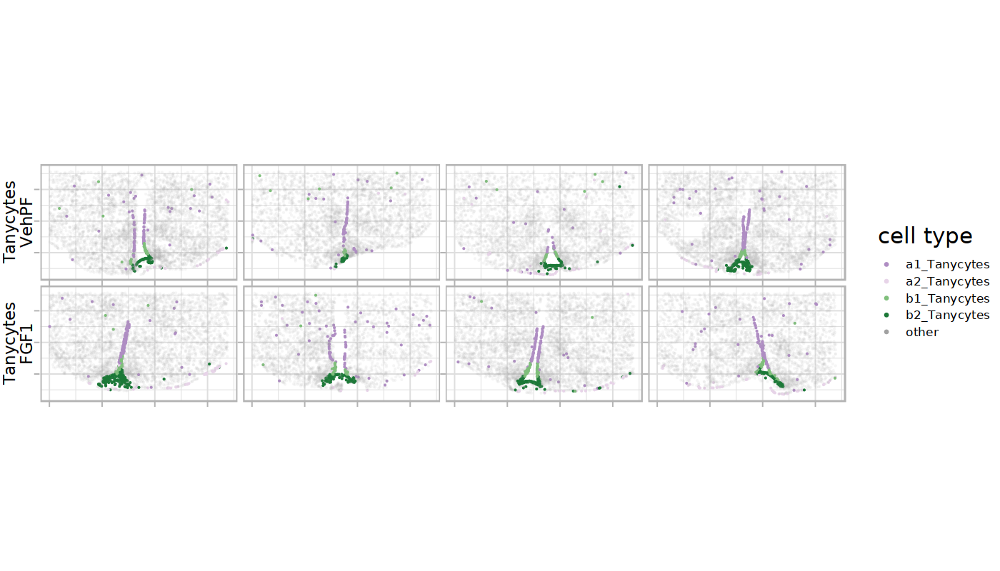

In [113]:
options(repr.plot.width=7, repr.plot.height=4)
tany_plot = plot_all_samples_ct_tany(coord_comparison_df, pt_size=0.2, plot_shape='2row')
tany_plot

In [114]:
coord_comparison_df %>% distinct(label) %>% pull

[1] "a2_Tanycytes"        "Astrocytes"          "Pou6f2__Prkcq__Whrn"
 [4] "Nfib_3"              "Nfix__Nfib"          "OPC"                
 [7] "Oligodendrocytes"    "b2_Tanycytes"        "Endothelial_cells"  
[10] "Pomc__Ttr"           "Esr1"                "Met__Prlh"          
[13] "Reln__Lef1"          "Lepr67"              "Agrp"               
[16] "Lepr89"              "Kiss1__Tac2"         "Fez1"               
[19] "Th__Slc6a3"          "Lpar1_oligo"         "Dlk1"               
[22] "Lepr15"              "Ghrh"                "Met__Pappa2"        
[25] "Gpr50__Tac2"         "Sst__Pthlh"          "Pomc__Glipr1"       
[28] "Th__Nfib"            "b1_Tanycytes"        "Htr3b"              
[31] "Pomc__Anxa2"         "Tmem215__Greb1"      "Arx__Nr5a2"         
[34] "Nfib_1"              "Npsr1__Epha3"        "Microglia"          
[37] "Ppp1r17"             "a1_Tanycytes"        "Sst__Unc13c"        
[40] "Hdc"                 "Trh__Lef1"           "Sst__Nts"           
[43] "Ppp1r17__Ltbp1"      "Irx5__Lmx1a"         "Slc17a6__Trhr"      
[46] "Ependymal_cells"     "Tbx19__Pirt"         "Trh__Cxcl12"        
[49] "Nfix__Nfib__Hgf"     "Nfib_2"              "Ppp1r17__Tafa4"     
[52] "Nfix__Nfib__Lhx6"    "Sim1"                "Tmem215__Dach2"

In [115]:
plot_single_slice_label_ct_neurons = function(coord_comparison_df, sample, pt_size=0.1){
    tany_regex = "^(Agrp|Pomc__Ttr|Pomc__Glipr1|Pomc__Anxa2|Htr3b|Lepr89)$"
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(str_detect(label, tany_regex) ~ label,
                                          TRUE ~ 'other'),
                random_column = sample(1:n(), size = n(), replace = TRUE),
               cell_type_factor = factor(str_detect(label, tany_regex), levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(this_cell_type))) %>%
        mutate(cell_color = factor(cell_color, levels=c('Agrp', 'Pomc__Ttr', 'Pomc__Anxa2', 'Pomc__Glipr1', 'Htr3b', 'Lepr89', 'other'))) %>%
        arrange(random_column, cell_color) %>% #cell plotting order determined here
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(name = 'cell type',
                             values = c('Agrp' = "#1f78b4",
                                        'Pomc__Ttr' =  "#006d2c",
                                        'Pomc__Anxa2' = "#66c2a4",
                                        'Pomc__Glipr1' = "#ccece6",
                                        'Htr3b' = '#e31a1c',
                                        'Lepr89' = '#fdbf6f',
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = c('Agrp' =  16,
                                        'Pomc__Ttr' = 16,
                                        'Pomc__Anxa2' = 16,
                                        'Pomc__Glipr1' = 16,
                                        'Htr3b' = 16,
                                        'Lepr89' = 16,
                                        'other' = 16), guide = 'none') +
          scale_alpha_manual(values = c('Agrp' =  1,
                                        'Pomc__Ttr' = 1,
                                        'Pomc__Anxa2' = 1,
                                        'Pomc__Glipr1' = 1,
                                        'Htr3b' = 1,
                                        'Lepr89' = 1,
                                        'other' = 0.1), guide = 'none') +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank(),    # Remove y-axis labels
              legend.position = "right", 
              legend.key.size = unit(0.3, "cm"),
              legend.text = element_text(lineheight=0.5, size = 6)
        )
    
    ggp
}


In [116]:
plot_all_samples_ct_neurons = function(coord_comparison_df, pt_size=0.2, plot_shape='2col'){
    p1 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'A1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'A2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p3 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'B1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p4 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'B2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p5 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'C1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'C2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p7 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'D1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p8 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'D2', pt_size=pt_size) #+ theme(legend.position = "bottom")

if (plot_shape == '2col'){
        layout <- '
AE
BF
CG
DH
'
}
if (plot_shape == '2row'){
            layout <- '
ABCD
EFGH
'
p1 = p1 + labs(y = paste0('Neurons', '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
p5 = p5 + labs(y = paste0('Neurons', '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
}


    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0),
#            legend.position = "bottom")
            )
    ggp
}

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”


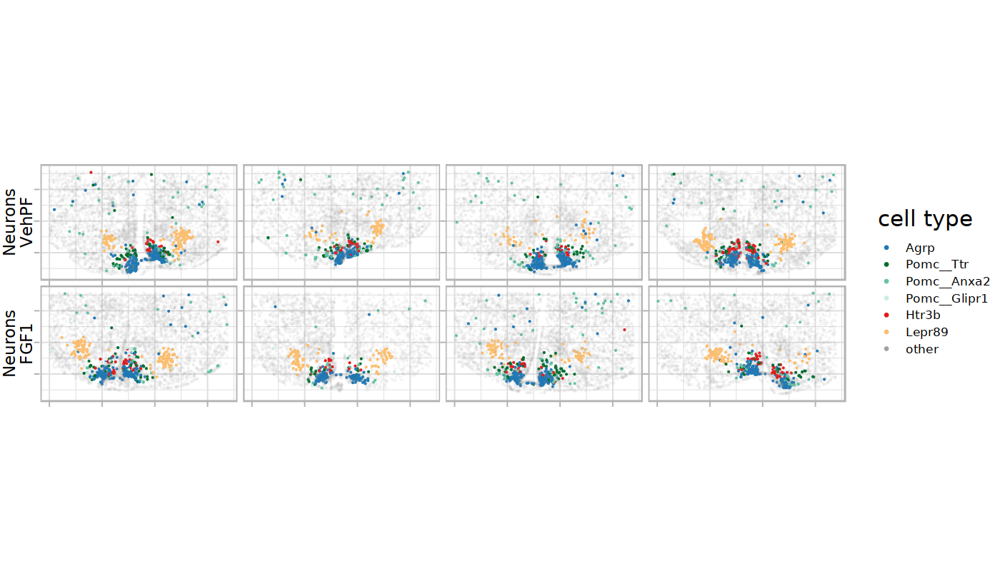

In [117]:
options(repr.plot.width=7, repr.plot.height=4)
neurons_plot = plot_all_samples_ct_neurons(coord_comparison_df, pt_size=0.2, plot_shape='2row')
neurons_plot

In [118]:
obj_fgf1 = qs::qread('_targets/objects/obj_d5_01')
obj_fgf1

An object of class Seurat 
27934 features across 50188 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 2 layers present: data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [119]:
xe_obj = qs::qread(xe_obj_path)

xe_obj@meta.data = xe_obj@meta.data %>%
mutate(predicted.polar_label = polar_label)

xe_obj@meta.data = xe_obj %>% `[[` %>%
mutate(base_label = predicted.polar_label %>% str_replace(fixed('.neg'), '') %>% str_replace(fixed('.none'), '') %>% str_replace(fixed('.pos'), ''))

xe_obj@meta.data = xe_obj@meta.data %>% mutate(base_label = str_replace(base_label, fixed('__'), '\n'))

In [120]:
xe_obj %>% `[[` %>% distinct(base_label) %>% pull(base_label)

[1] "Met\nPrlh"           "Kiss1\nTac2"         "Lepr89"             
 [4] "Lepr67"              "Fez1"                "Esr1"               
 [7] "Reln\nLef1"          "Nfib_3"              "Lpar1_oligo"        
[10] "Lepr15"              "Dlk1"                "Pomc\nTtr"          
[13] "Sst\nPthlh"          "Ghrh"                "Npsr1\nEpha3"       
[16] "Ppp1r17"             "Agrp"                "Pomc\nAnxa2"        
[19] "Nfix\nNfib"          "Gpr50\nTac2"         "Tmem215\nGreb1"     
[22] "Ppp1r17\nLtbp1"      "Met\nPappa2"         "Pomc\nGlipr1"       
[25] "Sst\nNts"            "Trh\nCxcl12"         "Nfix\nNfib__Hgf"    
[28] "Th\nSlc6a3"          "Nfib_1"              "Pou6f2\nPrkcq__Whrn"
[31] "Htr3b"               "Tbx19\nPirt"         "Ppp1r17\nTafa4"     
[34] "Th\nNfib"            "Hdc"                 "Nfib_2"             
[37] "Sst\nUnc13c"         "Nfix\nNfib__Lhx6"    "Arx\nNr5a2"         
[40] "Sim1"                "Slc17a6\nTrhr"       "Irx5\nLmx1a"        
[43] "Trh\nLef1"           "Tmem215\nDach2"      "OPC"                
[46] "Oligodendrocytes"    "Astrocytes"          "Endothelial_cells"  
[49] "b1_Tanycytes"        "Microglia"           "a1_Tanycytes"       
[52] "Ependymal_cells"     "b2_Tanycytes"        "a2_Tanycytes"

In [121]:
obj_fgf1 %>% `[[` %>% colnames

[1] "orig.ident"                         "nCount_RNA"                        
 [3] "nFeature_RNA"                       "nCount_RNA_SCOP"                   
 [5] "nFeature_RNA_SCOP"                  "Index.10x_SCOP"                    
 [7] "nCount_HTO_SCOP"                    "nFeature_HTO_SCOP"                 
 [9] "Index.HTO_SCOP"                     "nCount_spliced_SCOP"               
[11] "nFeature_spliced_SCOP"              "nCount_unspliced_SCOP"             
[13] "nFeature_unspliced_SCOP"            "HTO_mcl_maxID_SCOP"                
[15] "HTO_mcl_secondID_SCOP"              "HTO_mcl_margin_SCOP"               
[17] "HTO_mcl_classification_SCOP"        "HTO_mcl_classification.global_SCOP"
[19] "hash.mcl.ID_SCOP"                   "doublet_SCOP"                      
[21] "predicted_dub_std_SCOP"             "predicted_dub_cut_SCOP"            
[23] "barcode_SCOP"                       "Index.10x"                         
[25] "barcode"                            "strain"                            
[27] "treatment"                          "time"                              
[29] "collection_date"                    "isolation_date"                    
[31] "batch"                              "integrated_snn_res.0.5"            
[33] "seurat_clusters"                    "class"                             
[35] "integrated_snn_res.0.8"             "labels_lvl1_mg"                    
[37] "labels_lvl1"                        "prediction.score.max"              
[39] "labels_lvl2"                        "labels_chunk"                      
[41] "restored_grouping"                  "bl6_grouping"                      
[43] "fgf1_grouping"                      "labels"                            
[45] "hash.mcl.ID"                        "orig.batch"                        
[47] "group"                              "cell_class"                        
[49] "polar_label"

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing val

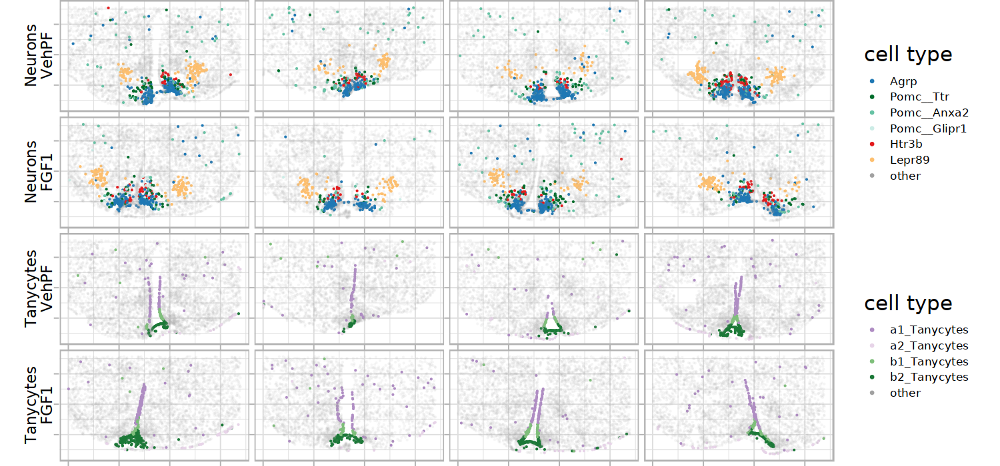

In [122]:
options(repr.plot.width=7.5, repr.plot.height=3.5)
layout <- '
B
B
C
C
'
ggp = wrap_plots(B = neurons_plot,
                 C = tany_plot,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0))

    ggp

In [123]:
ggp %>% ggsave("label_transfer_spatial_only_rctd.pdf", ., width = 7.5, height = 3.5)

Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing val

In [124]:
options(repr.plot.width=8.5, repr.plot.height=11)
layout <- '
ABBBBBB
ACCCCCC
ADDDDDD
AEEEEEE
AGGGGGG
'

ggp = wrap_plots(A = ggp_sig,
           B = p_Agrp,
           C = p_OPC,
#            D = p_Astrocytes,
           E = neurons_plot & theme(legend.position = 'bottom'),
           G = tany_plot & theme(legend.position = 'bottom'),
    design = layout) +
plot_layout(guides = 'auto') 

In [125]:
ggp %>% ggsave("spatial_sig_plots_mix_rctd.pdf", ., width = 7, height = 9)

Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing val

In [126]:
ggp %>% ggsave("spatial_sig_plots_mix_rctd.png", ., width = 8.5, height = 11)

Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 47 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 19 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 10 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 21 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 17 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 27 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 8 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 9 rows containing missing val